<a href="https://colab.research.google.com/github/markotesic/Robust-Evaluation-of-Generative-AI/blob/main/notebooks/3_LearningTheCapabilitiesOfLLMsToPerformAddition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Learning the Capabilities of LLMs to Perform Addition

Here, we construct a measurement layout for the Addition dataset (not yet public).

The dataset includes the instance-level performance on simple addition tasks of 10 LLMs: `GPT-3 Ada`, `GPT-3 Babbage`, `GPT-3 Curie`, `GPT-3 Davinci`, `text-davinci-001`, `text-davinci-002`, `text-davinci-003`, `GPT-3.5-turbo`, `GPT-4-0314`, and `GPT-4-0613`.

The dataset contains the following columns:

- `instance_id`: ID of an instance.
- `template_id`: ID of a prompt template. Each addition prompt was phrased in 8 different ways.
- `llm`: The large language model tested.
- `prompt`: The actual prompt.
- `response`: The LLM's response.
- `summand1`: The first number to be added.
- `summand2`: The second number to be added.
- `target`: The correct sum of the two summands.
- `digits1`: The number of digits in the first summand.
- `digits2`: The number of digits in the second summand.
- `min_digits`: $min(digits_1, digits_2)$, i.e., the number of digits in the smaller summand.
- `harm_mean`: $2 / (1/digits_1 + 1/digits_2)$, i.e., the harmonic mean of the number of digits in the two summands.
- `art_mean`: $(digits_1 + digits_2) / 2$, i.e., the arithmetic mean of the number of digits in the two summands.
- `max_digits`: $max(digits_1, digits_2)$, i.e., the number of digits in the larger summand.
- `carry`: The number of carrying operations required to add the two numbers.
- `success`: Indicates whether the response is correct (1) or incorrect (0).

In [ ]:
! pip install 'pymc>5.9' --quiet
! pip install 'numpyro' --quiet

In [ ]:
! python --version

Python 3.10.12


In [ ]:
import warnings

# Filter warnings for the specific library you want to suppress
warnings.filterwarnings("ignore", category=FutureWarning, module="sklearn")
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import pymc as pm
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, brier_score_loss, average_precision_score, f1_score
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.model_selection import train_test_split
from google.colab import files
sns.set(style="whitegrid")

print(f"Running on PyMC v{pm.__version__}")

Running on PyMC v5.10.4


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Define utility functions

In [ ]:
def logistic_general(x, min, max, c = 0, p = 0.99):

  """
  Generalized version of the logistic where min can be any number, not just 0 as above.

  :param min: The min ability/demand
  :param max: The max ability/demand
  :param c: Set different from 0 when we are dealing with multiple choice responses; e.g. c is 0.5 when the response is yes/no, and c is 0.25 if there are 4 possible choices
  :param p: The probability we want to set the max margin to (e.g. 0.99 or 0.999); the min margin will be set to 1 - p
  :parm k: The slope of the logistic
  """
  max_n = max - min
  k = - np.log((1 - p)/(p - c)) / max_n
  return c + ((1 - c) / (1 + np.exp(-k * x)))

# the margin is just the subtraction, assuming ability and demand are *in the same scale*
def margin(ability, demand):
    return ability - demand

# define generic function to evaluate a predictive method (such as LogisticRegression)
def evaluate_predictive_method(df_train, df_test, features_cols, response_col, predictive_method=LogisticRegression,
                               return_trained_method=False, compute_accuracy=False, trained_method=None, **kwargs):
    if len(features_cols) == 1 and type(df_train[features_cols[0]].iloc[0]) == np.ndarray:
        # if the features are already a numpy array, then don't convert to numpy array
        features_train = np.array(list(df_train[features_cols[0]].values))
        features_test = np.array(list(df_test[features_cols[0]].values))
    else:
        # traditional one
        features_train = df_train[features_cols].to_numpy()
        features_test = df_test[features_cols].to_numpy()

    if response_col in features_cols:
        raise ValueError("response_col must not be in features_cols")

    if trained_method is not None:
        method_instance = trained_method
    else:
        # fit logistic regression using training features and the agent col as response
        method_instance = predictive_method(**kwargs)
        method_instance.fit(features_train, df_train[response_col])

        #if predictive_method.__name__ == 'LogisticRegression':
        #  print(method_instance.coef_, method_instance.intercept_)

    # evaluate on the test set
    y_pred = method_instance.predict_proba(features_test)[:, 1]

    BrierScore = brier_score_loss(df_test[response_col], y_pred)

    # compute the ROCAUC and PR-AUC
    if not (sum(df_test[response_col]) == 0 or sum(df_test[response_col]) == len(df_test)):
        roc_auc = roc_auc_score(df_test[response_col], y_pred)
    else:
        roc_auc = np.nan

    if compute_accuracy:
        # compute accuracy by thresholding at 0.5
        y_pred_binary = y_pred > 0.5
        accuracy = np.mean(y_pred_binary == df_test[response_col])

    return_list = [BrierScore, roc_auc]
    if compute_accuracy:
        return_list.append(accuracy)
    if return_trained_method:
        return_list.append(method_instance)
    return return_list

def process_predictive_data_and_plot_histogram(predictive_data, predictive_type:str,save = False):
    # Convert to DataFrames and calculate mean directly
    if predictive_type == 'prior':
        predictive_mean = predictive_data.prior_predictive["taskPerformance"].to_dataframe().groupby('draw').mean()
    elif predictive_type == 'posterior':
        predictive_mean = predictive_data.posterior_predictive["taskPerformance"].to_dataframe().groupby('draw').mean()
    else:
        raise ValueError("predictive_type must be 'prior' or 'posterior'")

    # Get observed
    observed = predictive_data.observed_data.to_dataframe().mean().values[0]

    # Get simulated mean
    simulated_mean = predictive_mean['taskPerformance'].mean()


    # Plotting
    plt.figure(figsize=(8, 6))
    # Histogram of predictive means
    sns.histplot(predictive_mean['taskPerformance'], kde=True, stat='density', edgecolor='black', bins=20) #color='skyblue'

    #Vertical line for observed data
    plt.axvline(x=observed, color='red', linestyle='--', linewidth=2, label='Observed')
    #Vertical line for the mean of simulated data
    plt.axvline(x=simulated_mean, color='blue', linestyle='-', linewidth=2, label='Simulated')


    plt.xlabel('Task Performance')
    plt.ylabel('Density')
    plt.title(f'{predictive_type.capitalize()} Predictive Task Performance Distribution: {LLM}')
    plt.legend()
    plt.xlim(0, 1)
    if save:
      filename = f"/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/{predictive_type}_predictive_{LLM}.png"
      plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

# Make predictions after training a measurement layout
def predict(m, trace, relevantData, var_name:str):
    with m:
        predictions = pm.sample_posterior_predictive(trace, var_names=[var_name], return_inferencedata=False,
                                                     predictions=True, extend_inferencedata=False)
        predictionChainRuns = predictions[var_name][:, :, 0:len(relevantData)]
        predictionsInstance = np.mean(predictionChainRuns, (0, 1))

    return predictionsInstance

## Load and explore the Addition dataset

In [ ]:
addition_data = pd.read_pickle('/content/drive/MyDrive/Colab Notebooks/Addition_data/addition_data_30.pkl')

In [ ]:
addition_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32960 entries, 2 to 471014
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   instance_id  32960 non-null  int64  
 1   template_id  32960 non-null  int64  
 2   llm          32960 non-null  object 
 3   prompt       32960 non-null  object 
 4   response     32960 non-null  object 
 5   summand1     32960 non-null  object 
 6   summand2     32960 non-null  object 
 7   target       32960 non-null  object 
 8   digits1      32960 non-null  int64  
 9   digits2      32960 non-null  int64  
 10  min_digits   32960 non-null  int64  
 11  harm_mean    32960 non-null  float64
 12  art_mean     32960 non-null  float64
 13  max_digits   32960 non-null  int64  
 14  carry        32960 non-null  float64
 15  success      32960 non-null  int64  
dtypes: float64(3), int64(7), object(6)
memory usage: 4.3+ MB


In [ ]:
addition_data['llm'].unique()

array(['GPT-3 Ada', 'GPT-3 Babbage', 'GPT-3 Curie', 'GPT-3 Davinci',
       'text-davinci-001', 'text-davinci-002', 'text-davinci-003',
       'GPT-4-0314', 'GPT-3.5-turbo', 'GPT-4-0613'], dtype=object)

In [ ]:
addition_data.groupby(['llm'])['success'].value_counts().unstack(fill_value=0)

success,0,1
llm,,
GPT-3 Ada,3286,10
GPT-3 Babbage,3272,24
GPT-3 Curie,3263,33
GPT-3 Davinci,3228,68
GPT-3.5-turbo,1989,1307
GPT-4-0314,2214,1082
GPT-4-0613,2117,1179
text-davinci-001,3139,157
text-davinci-002,2850,446


In [ ]:
addition_data.describe()

,instance_id,template_id,digits1,digits2,min_digits,harm_mean,art_mean,max_digits,carry,success
count,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000
mean,1439.637621,8.500000,15.359223,16.148058,11.140777,13.401380,15.753641,20.366505,5.740291,0.144478
std,833.347137,4.153375,8.384815,8.696461,7.338968,7.473540,6.314904,7.058748,4.209165,0.351579
min,1.000000,3.000000,1.000000,1.000000,1.000000,1.333333,1.500000,2.000000,0.000000,0.000000
25%,750.000000,5.500000,8.000000,8.000000,5.000000,6.896552,11.000000,15.000000,2.000000,0.000000
50%,1392.000000,7.500000,16.000000,17.000000,10.000000,12.733251,16.000000,22.000000,5.000000,0.000000
75%,2141.000000,11.750000,22.000000,23.250000,17.000000,20.000000,21.000000,26.000000,9.000000,0.000000
max,3123.000000,15.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,20.000000,1.000000


In [ ]:
addition_data.describe(include='object')

,llm,prompt,response,summand1,summand2,target
count,32960,32960,32960,32960,32960,32960
unique,10,3296,26575,389,380,412
top,GPT-3 Ada,The sum of 656050998910983832047 and 4871137 is,not even close to the sum of the sum of the s...,7020740700789054161494,2,656050998910988703184
freq,3296,10,93,240,400,80


In [ ]:
for indx, prompt in enumerate(addition_data['prompt'][:8], start = 1):
  print(f'Template {indx}: {prompt}')

Template 1: The sum of 656050998910983832047 and 4871137 is
Template 2: Add: 656050998910983832047 + 4871137 =
Template 3: Make the addition of 656050998910983832047 and 4871137.
Template 4: By adding 656050998910983832047 and 4871137, the result is
Template 5: If you add 656050998910983832047 and 4871137, you get
Template 6: If you have 656050998910983832047 and 4871137, and you add them up, you get
Template 7: Find the value of x + y when x=656050998910983832047 and y=4871137.
Template 8: Imagine you have two numbers, 656050998910983832047 and 4871137, and you added them together. What number would you get?


### Plot aggregate accuracy

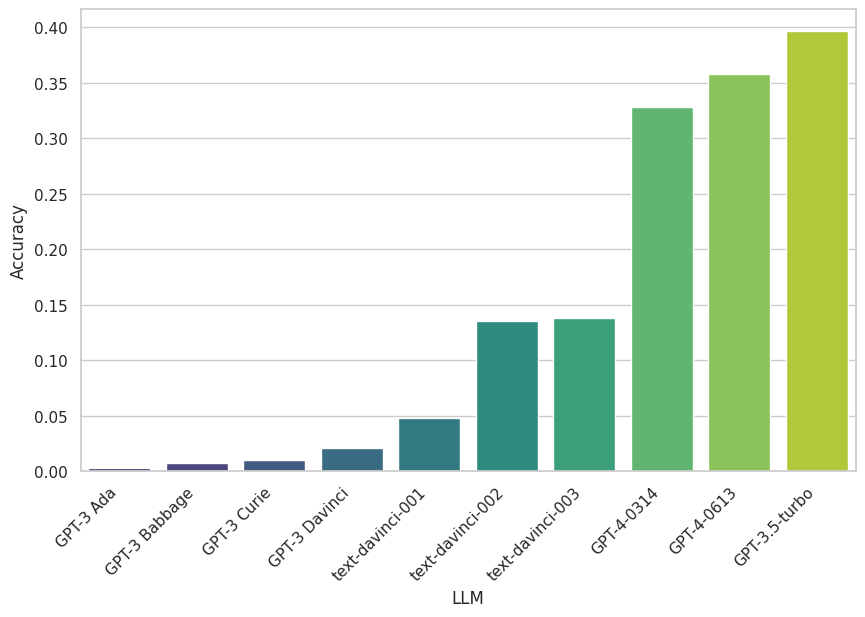

In [ ]:
accuracy_data = addition_data.groupby('llm')['success'].mean().reset_index()

accuracy_data.rename(columns={'llm': 'LLM', 'success': 'Accuracy'}, inplace=True)
accuracy_data_sorted = accuracy_data.sort_values(by='Accuracy', ascending=True)

plt.figure(figsize=(10,6))
ax = sns.barplot(x='LLM', y='Accuracy', hue='LLM', data=accuracy_data_sorted, palette='viridis', legend=False)
plt.xticks(rotation=45, ha="right")
filename = "/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/aggregate_accuracy.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
accuracy_data_sorted

,LLM,Accuracy
0,GPT-3 Ada,0.003034
1,GPT-3 Babbage,0.007282
2,GPT-3 Curie,0.010012
3,GPT-3 Davinci,0.020631
7,text-davinci-001,0.047633
8,text-davinci-002,0.135316
9,text-davinci-003,0.138350
5,GPT-4-0314,0.328277
6,GPT-4-0613,0.357706
4,GPT-3.5-turbo,0.396541


### Create new features

Here, we create new features. One feature calculates the standard deviation of the digits of each summand and sums them. The other feature takes the maximum of the two standard deviations. The motivation for introducing these features is that numbers with many repeating digits, such as 9999999 or 98989898, will most likely require carrying at each digit place, even though they may be very simple to add, especially if the other summand also has a low digit standard deviation, like 111111 or 13121312.

We also create new features by normalizing the number of carry operations with the harmonic mean, arithmetic mean, maximum digits, and minimum digits.

In [ ]:
#Function to calculate the standard deviation of the digits in a summand
def num_sd(number:str):

  digits = [int(char) for char in number]

  return(np.std(digits))


In [ ]:
# Calculate max and sum of digit standard deviations
addition_data['max_sd'] = addition_data.apply(lambda x: max(num_sd(x['summand1']), num_sd(x['summand2'])), axis=1)
addition_data['sum_sd'] = addition_data.apply(lambda x: num_sd(x['summand1']) + num_sd(x['summand2']), axis=1)

# Calculate ratio of carry and harmonic mean columns
addition_data['carry_harm_mean_ratio'] = addition_data['carry'] / addition_data['harm_mean']
addition_data['carry_art_mean_ratio'] = addition_data['carry'] / addition_data['art_mean']
addition_data['carry_to_length_longer'] = addition_data['carry'] / addition_data['max_digits']
addition_data['carry_to_length_shorter'] = addition_data['carry'] / addition_data['min_digits']


In [ ]:
addition_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32960 entries, 2 to 471014
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   instance_id              32960 non-null  int64  
 1   template_id              32960 non-null  int64  
 2   llm                      32960 non-null  object 
 3   prompt                   32960 non-null  object 
 4   response                 32960 non-null  object 
 5   summand1                 32960 non-null  object 
 6   summand2                 32960 non-null  object 
 7   target                   32960 non-null  object 
 8   digits1                  32960 non-null  int64  
 9   digits2                  32960 non-null  int64  
 10  min_digits               32960 non-null  int64  
 11  harm_mean                32960 non-null  float64
 12  art_mean                 32960 non-null  float64
 13  max_digits               32960 non-null  int64  
 14  carry                    3

In [ ]:
addition_data.describe()

,instance_id,template_id,digits1,digits2,min_digits,harm_mean,art_mean,max_digits,carry,success,max_sd,sum_sd,carry_harm_mean_ratio,carry_art_mean_ratio,carry_to_length_longer,carry_to_length_shorter
count,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000,32960.000000
mean,1439.637621,8.500000,15.359223,16.148058,11.140777,13.401380,15.753641,20.366505,5.740291,0.144478,2.917900,5.138604,0.393176,0.333707,0.276534,0.509817
std,833.347137,4.153375,8.384815,8.696461,7.338968,7.473540,6.314904,7.058748,4.209165,0.351579,0.367614,1.011162,0.181267,0.182761,0.177347,0.249742
min,1.000000,3.000000,1.000000,1.000000,1.000000,1.333333,1.500000,2.000000,0.000000,0.000000,0.816497,0.816497,0.000000,0.000000,0.000000,0.000000
25%,750.000000,5.500000,8.000000,8.000000,5.000000,6.896552,11.000000,15.000000,2.000000,0.000000,2.728743,4.785051,0.285189,0.200000,0.133333,0.400000
50%,1392.000000,7.500000,16.000000,17.000000,10.000000,12.733251,16.000000,22.000000,5.000000,0.000000,2.919854,5.385416,0.410256,0.333333,0.272727,0.500000
75%,2141.000000,11.750000,22.000000,23.250000,17.000000,20.000000,21.000000,26.000000,9.000000,0.000000,3.099899,5.806694,0.530303,0.465116,0.400000,0.666667
max,3123.000000,15.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,20.000000,1.000000,4.500000,7.362210,1.066667,0.800000,0.777778,2.000000


In [ ]:
addition_data.describe(include='object')

,llm,prompt,response,summand1,summand2,target
count,32960,32960,32960,32960,32960,32960
unique,10,3296,26575,389,380,412
top,GPT-3 Ada,The sum of 656050998910983832047 and 4871137 is,not even close to the sum of the sum of the s...,7020740700789054161494,2,656050998910988703184
freq,3296,10,93,240,400,80


### Scale the data

We now scale the data using min-max normalization, which performs a linear transformation of the data to the $(0,1)$ range. This is generally a good practice when the features are on different scales. Later, when we build a measurement layout, this will allow us to have all the variables on the same scale and improve interpretation.

In [ ]:
from sklearn.preprocessing import MinMaxScaler

columns_to_scale = ['min_digits','harm_mean', 'art_mean', 'max_digits', 'carry',
                    'max_sd', 'sum_sd', 'carry_art_mean_ratio', 'carry_harm_mean_ratio', 'carry_to_length_longer', 'carry_to_length_shorter']

scaler = MinMaxScaler(feature_range=(0, 10))

# Apply MinMaxScaler to the selected columns and create new columns for the scaled data
scaled_columns = scaler.fit_transform(addition_data[columns_to_scale])

# Add the scaled columns to the DataFrame with new column names
for i, col in enumerate(columns_to_scale):
    addition_data[col + '_scaled'] = scaled_columns[:, i]


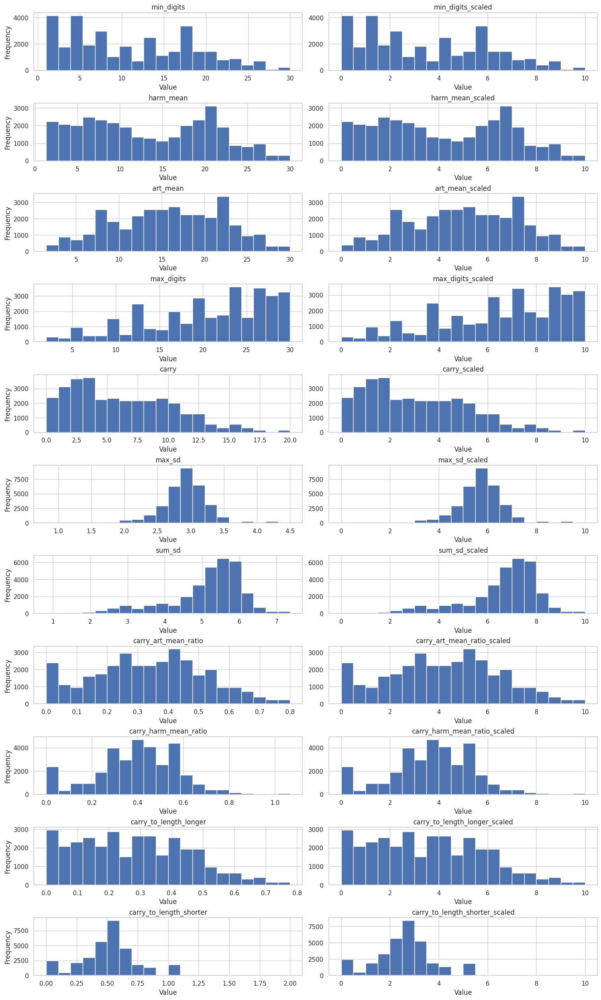

In [ ]:
columns_to_plot_original = [
    'min_digits', 'harm_mean', 'art_mean', 'max_digits', 'carry',
    'max_sd', 'sum_sd', 'carry_art_mean_ratio', 'carry_harm_mean_ratio', 'carry_to_length_longer',
    'carry_to_length_shorter'
]

columns_to_plot_scaled = [col + '_scaled' for col in columns_to_plot_original]

# Adjusting the number of rows and columns for the subplot grid
n_rows = len(columns_to_plot_original)
n_cols = 2  # One for original and one for scaled

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 25),layout="constrained")

for i in range(n_rows):
    # Plot original data
    ax_orig = axes[i, 0]
    ax_orig.hist(addition_data[columns_to_plot_original[i]], bins=20)
    ax_orig.set_title(columns_to_plot_original[i])
    ax_orig.set_xlabel('Value')
    ax_orig.set_ylabel('Frequency')

    # Plot scaled data
    ax_scaled = axes[i, 1]
    ax_scaled.hist(addition_data[columns_to_plot_scaled[i]], bins=20)
    ax_scaled.set_title(columns_to_plot_scaled[i])
    ax_scaled.set_xlabel('Value')


plt.show()


### Correlations between the features and success on the task

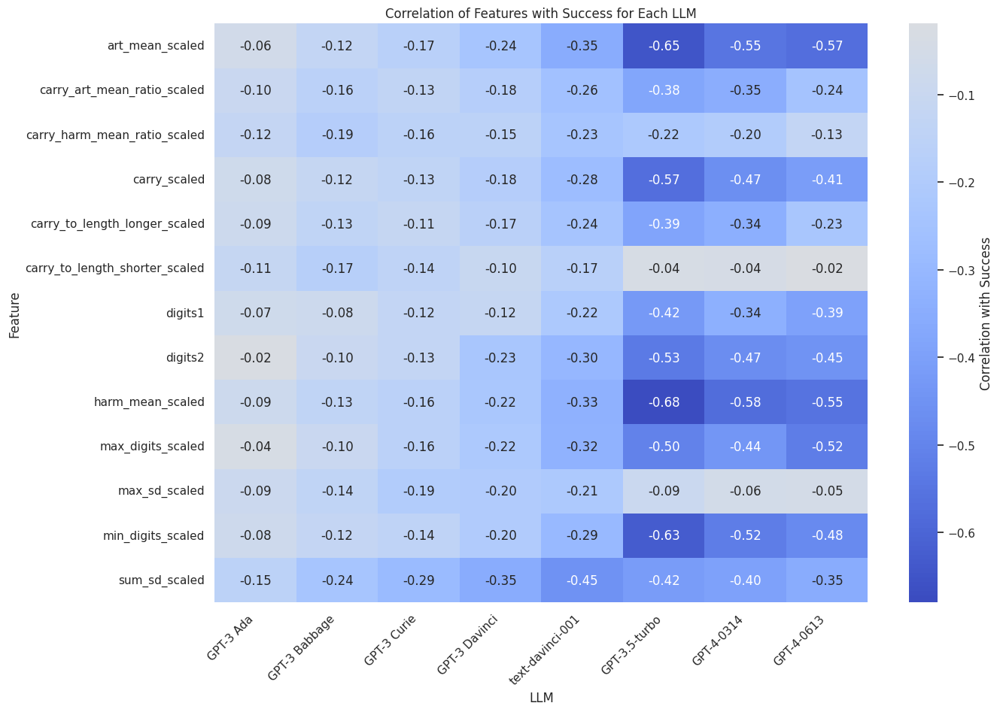

In [ ]:
feats = ['digits1', 'digits2', 'min_digits_scaled', 'harm_mean_scaled', 'art_mean_scaled', 'max_digits_scaled', 'carry_scaled',\
          'max_sd_scaled','sum_sd_scaled','carry_art_mean_ratio_scaled','carry_harm_mean_ratio_scaled', 'carry_to_length_longer_scaled',\
          'carry_to_length_shorter_scaled']

correlations = []
llms = addition_data['llm'].unique()

for llm in llms:
    llm_data = addition_data[addition_data['llm'] == llm]
    for feat in feats:
        corr = llm_data[[feat, 'success']].corr().iloc[0, 1]  # Get correlation between feature and success
        correlations.append({'LLM': llm, 'Feature': feat, 'Correlation': corr})


corr_df = pd.DataFrame(correlations)

# Define the custom order for LLMs
llm_order = ['GPT-3 Ada', 'GPT-3 Babbage', 'GPT-3 Curie', 'GPT-3 Davinci',
             'text-davinci-001', 'text-davinci-002, text-davinci-003',
             'GPT-3.5-turbo', 'GPT-4-0314', 'GPT-4-0613']

# Convert the 'LLM' column to a categorical type with the specified order
corr_df['LLM'] = pd.Categorical(corr_df['LLM'], categories=llm_order, ordered=True)

pivot_df = corr_df.pivot_table(index="Feature", columns="LLM", values="Correlation")

plt.figure(figsize=(14, 10))
sns.heatmap(pivot_df, annot=True, fmt=".2f", cmap="coolwarm", center=0, cbar_kws={'label': 'Correlation with Success'})
plt.title('Correlation of Features with Success for Each LLM')
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
filename = "/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/correlations_success.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')
plt.show()


From the above, we observe that success is negatively correlated with all the features. This suggests that a higher value of a feature is associated with greater demands for a language model.

We find little correlation between the features and success from GPT-3 Ada, GPT-3 Babbage, GPT-3 Curie, and GPT-3 Davinci. However, we observe moderate to strong correlations between the features (especially `harm_mean_scaled`, `carry_scaled`, and `sd_sum_scaled`) and success for all other LLMs.

Below we plot correlations between all the features.

In [ ]:
feats = ['digits1', 'digits2', 'min_digits_scaled', 'harm_mean_scaled', 'art_mean_scaled', 'max_digits_scaled', 'carry_scaled',\
          'max_sd_scaled','sum_sd_scaled','carry_art_mean_ratio_scaled','carry_harm_mean_ratio_scaled', 'carry_to_length_longer_scaled',\
          'carry_to_length_shorter_scaled','success']

llms = addition_data['llm'].unique()

# do this for each llm
correlation_df = pd.DataFrame()
all_corrs = {}
for llm in llms:
    corr = addition_data[addition_data['llm'] == llm][feats].corr()
    all_corrs[llm] = corr

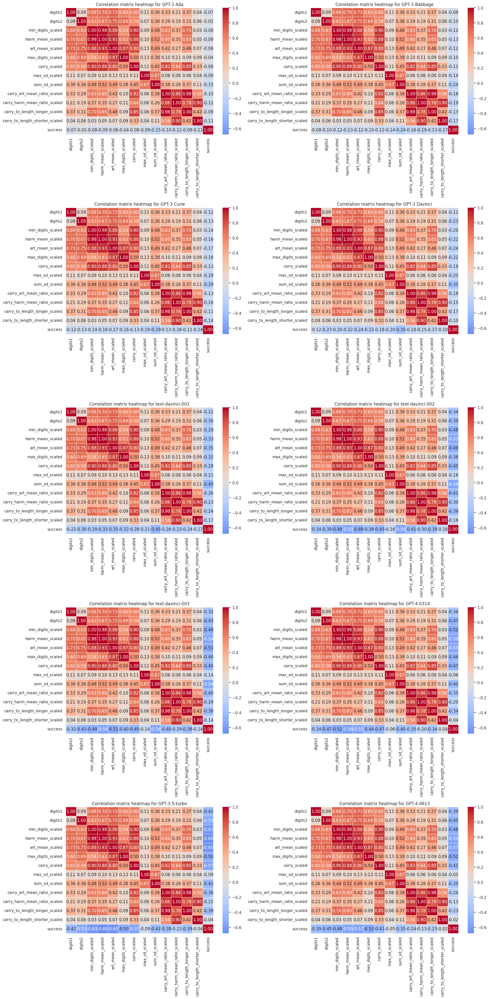

In [ ]:
n_llms = len(llms)
ncols = 2
nrows = n_llms // ncols + (n_llms % ncols > 0)

global_min = min(all_corrs[llm].min().min() for llm in llms)
global_max = max(all_corrs[llm].max().max() for llm in llms)

plt.figure(figsize=(ncols * 10, nrows * 8))

# Loop through each LLM
for index, llm in enumerate(llms):
    plt.subplot(nrows, ncols, index + 1)

    # Create the heatmap
    sns.heatmap(all_corrs[llm], annot=True, fmt=".2f", cmap="coolwarm", center = 0, vmin=global_min, vmax=global_max,linewidths=0.5)
    plt.title(f"Correlation matrix heatmap for {llm}")

    if index == 0:  # Adjust this condition to target the figure you want to save
        plt.savefig(f"/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/correlations_all_{llm}.png", dpi=300,bbox_inches='tight')

plt.tight_layout()
plt.show()

Here we find that size-related features are correlated as are the carry-related ones. However, within each cluster, certain features show less correlation with those from another cluster, for example, `sum_sd_scaled`, `harm_mean_scaled`, `carry_art_mean_ratio_scaled`. Here we go for the normalized `carry_scaled` variable as `carry_scaled` itself is highly correlated with other size features.

Below we plot histograms of successes and failures for each meta-feature and for each LLM. These plots will provide us with information on the discriminative power of each feature with respect to success in the task.

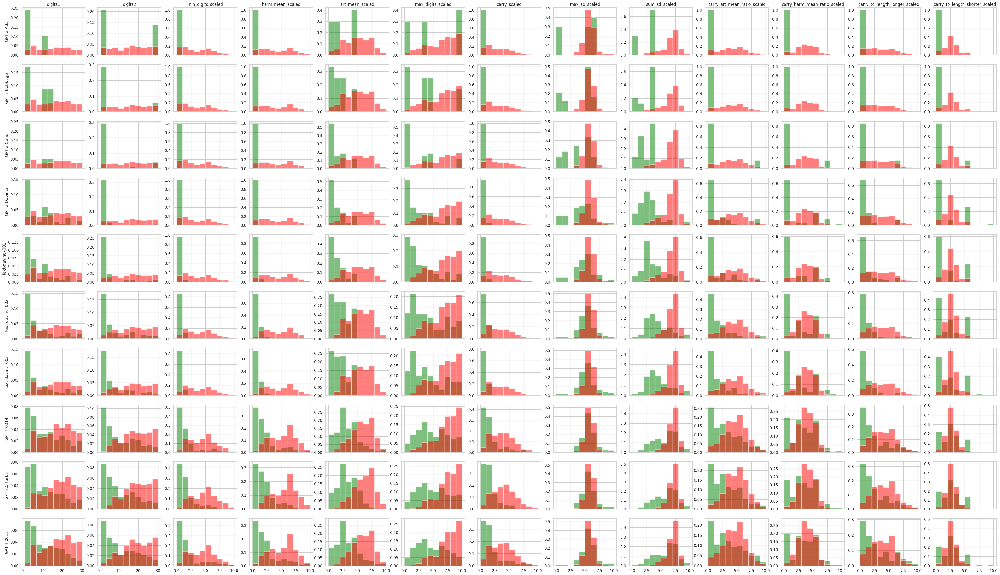

In [ ]:
feats = ['digits1', 'digits2', 'min_digits_scaled', 'harm_mean_scaled', 'art_mean_scaled', 'max_digits_scaled', 'carry_scaled',\
          'max_sd_scaled','sum_sd_scaled','carry_art_mean_ratio_scaled','carry_harm_mean_ratio_scaled', 'carry_to_length_longer_scaled',\
          'carry_to_length_shorter_scaled']

fig, axes = plt.subplots(len(llms), len(feats), figsize=(4 * len(feats), 3 * len(llms)), sharex="col")

for i, llm in enumerate(llms):
    merged_df_success = addition_data[(addition_data['success'] == 1) & (addition_data['llm'] == llm)]
    merged_df_fail = addition_data[(addition_data['success'] == 0) & (addition_data['llm'] == llm)]
    for j, feat in enumerate(feats):
        bins = np.histogram(np.hstack((merged_df_success[feat], merged_df_fail[feat])), bins=10)[1]
        axes[i, j].hist(merged_df_success[feat], density=True, alpha=0.5, facecolor='green', label="Success", bins=bins)
        axes[i, j].hist(merged_df_fail[feat], density=True, alpha=0.5, facecolor='red', label="Fail", bins=bins)
        axes[0, j].set_title(feat)
    axes[i, 0].set_ylabel(llm)
plt.show()

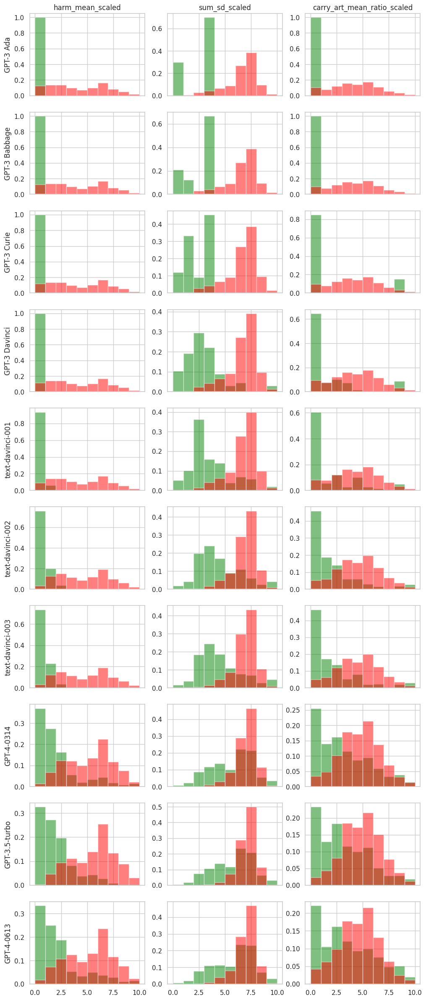

In [ ]:
feats = ['harm_mean_scaled','sum_sd_scaled','carry_art_mean_ratio_scaled']

fig, axes = plt.subplots(len(llms), len(feats), figsize=(4 * len(feats), 3 * len(llms)), sharex="col")

for i, llm in enumerate(llms):
    merged_df_success = addition_data[(addition_data['success'] == 1) & (addition_data['llm'] == llm)]
    merged_df_fail = addition_data[(addition_data['success'] == 0) & (addition_data['llm'] == llm)]
    for j, feat in enumerate(feats):
        bins = np.histogram(np.hstack((merged_df_success[feat], merged_df_fail[feat])), bins=10)[1]
        axes[i, j].hist(merged_df_success[feat], density=True, alpha=0.5, facecolor='green', label="Success", bins=bins)
        axes[i, j].hist(merged_df_fail[feat], density=True, alpha=0.5, facecolor='red', label="Fail", bins=bins)
        axes[0, j].set_title(feat)
    axes[i, 0].set_ylabel(llm)
filename = "/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/feat_disc_ability.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')
plt.show()

Given the above, `harm_mean` (the harmonic mean of the number of digits in the two numbers), `carry_art_mean_ratio` (the ratio between the number of carry operations required to add the two numbers and the arithmetic mean of the number of digits in the two numbers), and `sd_sum` (the sum of the standard deviations of the digits in the two numbers) may be good choices for predicting success in the task.

Here, we choose `carry_art_mean_ratio` instead of `carry` (the number of carrying operations) since carry is highly correlated with the size-related features (which is expected) and `carry_art_mean_ratio` account for the number size.

## Common Predictive Models

In this section, we construct two commonly used predictive models—Logistic Regression and XGBoost—alongside several standard baseline models. These will be used to compare the predictive performance of the measurement layout.

First, we divide the dataset into two parts: a training set and a test set.

In [ ]:
# Function to split data into train and test
def split_data(df, test_size=0.2):
    return train_test_split(df, test_size=test_size, random_state=42)

In [ ]:
# Dictionaries to hold the training and test data
llms = addition_data['llm'].unique()
train_dict = {}
test_dict = {}

# Split data for each LLM
for llm in llms:
    # Filter data for the current LLM
    llm_data = addition_data[addition_data['llm'] == llm]

    # Split the data into training and test sets
    train, test = train_test_split(llm_data, test_size=0.2)  # Adjust test_size as needed

    # Store the split data in the dictionaries
    train_dict[llm] = train
    test_dict[llm] = test


Print the size of the training and test sets.

Note: As the dataset is imbalanced, it's important to print the value counts for the test set to ensure there are at least a few instances for each label, i.e., success (1) and failure (0). If any of the labels has no instances, we won't be able to calculate some metrics, such as AUROC.

In [ ]:
for llm in llms:
    train_size = len(train_dict[llm])
    test_size = len(test_dict[llm])

    success_counts = test_dict[llm]['success'].value_counts().to_string()

    print(f"{llm}:")
    print(f"  Train size: {train_size}")
    print(f"  Test size: {test_size}")
    print(f"  Test set success counts:\n{success_counts}\n")

GPT-3 Ada:
  Train size: 2636
  Test size: 660
  Test set success counts:
success
0    659
1      1

GPT-3 Babbage:
  Train size: 2636
  Test size: 660
  Test set success counts:
success
0    657
1      3

GPT-3 Curie:
  Train size: 2636
  Test size: 660
  Test set success counts:
success
0    649
1     11

GPT-3 Davinci:
  Train size: 2636
  Test size: 660
  Test set success counts:
success
0    642
1     18

text-davinci-001:
  Train size: 2636
  Test size: 660
  Test set success counts:
success
0    634
1     26

text-davinci-002:
  Train size: 2636
  Test size: 660
  Test set success counts:
success
0    570
1     90

text-davinci-003:
  Train size: 2636
  Test size: 660
  Test set success counts:
success
0    577
1     83

GPT-4-0314:
  Train size: 2636
  Test size: 660
  Test set success counts:
success
0    451
1    209

GPT-3.5-turbo:
  Train size: 2636
  Test size: 660
  Test set success counts:
success
0    396
1    264

GPT-4-0613:
  Train size: 2636
  Test size: 660
  Test 

### Train the assessors: logistic regression and XBGboost model and add baselines

In [ ]:
list_features = ['harm_mean_scaled','sum_sd_scaled','carry_art_mean_ratio_scaled']

predictive_methods_df = pd.DataFrame()
for predictive_method in [LogisticRegression, XGBClassifier]:
    for llm in llms:
        print(f"{predictive_method.__name__} for {llm}")
        df_train = train_dict[llm]  # default training set
        df_test = test_dict[llm]  # default test set

        BrierScore, roc_auc, trained_method = evaluate_predictive_method(df_train, df_test,
                                                                                                  list_features,
                                                                                                  "success",
                                                                                                  predictive_method=predictive_method,
                                                                                                  return_trained_method=True,
                                                                                                  compute_accuracy=False)





        predictive_methods_df = pd.concat([predictive_methods_df, pd.DataFrame(
            {"predictive_method": predictive_method.__name__, "llm": llm, "BrierScore": BrierScore,
             "AUROC": roc_auc, "trained_method": trained_method},
            index=[0])])

        for baseline in ["always_1", "always_0", "average_success_on_train"]:
            if baseline == "always_1": #this baseline predicts success (1) with probability 1 for each instance
                predictions = np.ones(len(df_test))
            elif baseline == "always_0": #this baseline predicts success (1) with probability 0 for each instance
                predictions = np.zeros(len(df_test))
            elif baseline == "average_success_on_train": #this baseline predicts success (1) with the average probability of success on the training sets for each instance
                predictions = np.ones(len(df_test)) * df_train["success"].mean()
            else:
                raise ValueError("baseline not recognized")

            BrierScore = brier_score_loss(df_test["success"], predictions)
            roc_auc = roc_auc_score(df_test["success"], predictions)
            predictive_methods_df = pd.concat([predictive_methods_df, pd.DataFrame({"predictive_method": baseline, "llm": llm, "BrierScore": BrierScore,"AUROC": roc_auc,}, index=[0])])

LogisticRegression for GPT-3 Ada
LogisticRegression for GPT-3 Babbage
LogisticRegression for GPT-3 Curie
LogisticRegression for GPT-3 Davinci
LogisticRegression for text-davinci-001
LogisticRegression for text-davinci-002
LogisticRegression for text-davinci-003
LogisticRegression for GPT-4-0314
LogisticRegression for GPT-3.5-turbo
LogisticRegression for GPT-4-0613
XGBClassifier for GPT-3 Ada
XGBClassifier for GPT-3 Babbage
XGBClassifier for GPT-3 Curie
XGBClassifier for GPT-3 Davinci
XGBClassifier for text-davinci-001
XGBClassifier for text-davinci-002
XGBClassifier for text-davinci-003
XGBClassifier for GPT-4-0314
XGBClassifier for GPT-3.5-turbo
XGBClassifier for GPT-4-0613


In [ ]:
# Filter for rows where predictive_method is either XGBClassifier or LogisticRegression
filtered_df = predictive_methods_df[
    predictive_methods_df['predictive_method'].isin(['XGBClassifier', 'LogisticRegression'])
]

# Select specific columns and sort by BrierScore
result_df = filtered_df[['predictive_method', 'llm', 'AUROC', 'BrierScore']].sort_values(by="llm")
result_df

,predictive_method,llm,AUROC,BrierScore
0,LogisticRegression,GPT-3 Ada,0.983308,0.001669
0,XGBClassifier,GPT-3 Ada,0.996965,0.001815
0,LogisticRegression,GPT-3 Babbage,0.980720,0.004767
0,XGBClassifier,GPT-3 Babbage,0.998985,0.001929
0,LogisticRegression,GPT-3 Curie,0.979689,0.011063
0,XGBClassifier,GPT-3 Curie,0.993837,0.007090
0,LogisticRegression,GPT-3 Davinci,0.966295,0.018155
0,XGBClassifier,GPT-3 Davinci,0.981006,0.015822
0,LogisticRegression,GPT-3.5-turbo,0.908149,0.118618
0,XGBClassifier,GPT-3.5-turbo,0.949988,0.083542


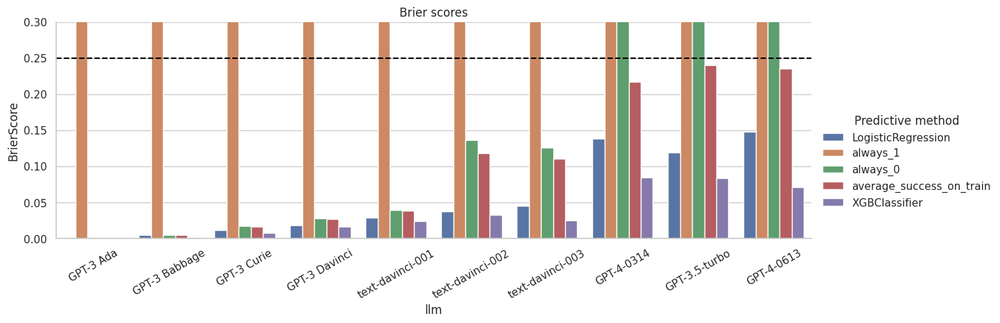

In [ ]:
g = sns.catplot(x="llm", y="BrierScore", hue="predictive_method", data=predictive_methods_df, kind="bar", height=4, aspect=3, legend_out=True)
plt.ylim(0, .3)
plt.axhline(y=0.25, color='black', linestyle='--')
plt.title("Brier scores")
plt.xticks(rotation=30)
g._legend.set_title('Predictive method')
filename = "/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/brier_scores_assessors.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')
plt.show()

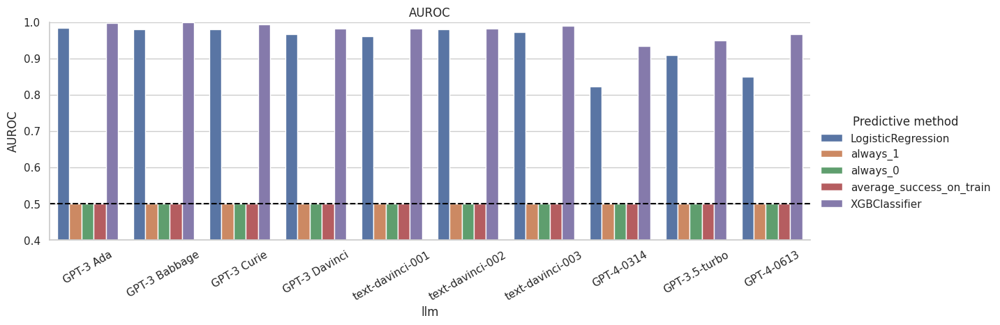

In [ ]:
g = sns.catplot(x="llm", y="AUROC", hue="predictive_method", data=predictive_methods_df, kind="bar", height=4, aspect=3,legend_out=True)
plt.ylim(0.4, 1)
plt.axhline(y=0.5, color='black', linestyle='--')
plt.title("AUROC")
plt.xticks(rotation=30)
g._legend.set_title('Predictive method')
filename = "/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/auroc_scores_assessors.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')
plt.show()

## Measurment layout

### Define the Bayesian model

In [ ]:
def setupSumModel(data):

  m = pm.Model()
  with m:

    # Define abilities and their priors
    sizeAbility = pm.Normal("sizeAbility", 0,6)
    carryAbility = pm.Normal("carryAbility", 0,6)
    digitVarietyAbility = pm.Normal("digitVarietyAbility", 0,6)

    # Define environment variables as MutableData
    digitsMean = pm.MutableData("digitsMean", data['harm_mean'].values)
    ratioCarry = pm.MutableData("ratioCarry", data['carry_art_mean_ratio'].values)
    sumSD = pm.MutableData("sumSD", data['sum_sd'].values)

    # Margins / partial performance
    sizePerformance = pm.Deterministic("sizePerformance", logistic_general(margin(sizeAbility,digitsMean),min=0,max=12,c=0,p=0.99))
    carryPerformance = pm.Deterministic("carryPerformance", logistic_general(margin(carryAbility,ratioCarry),min=0,max=12,c=0,p=0.99))
    digitVarietyPerformance = pm.Deterministic("digitVarietyPerformance", logistic_general(margin(digitVarietyAbility,sumSD),min=0,max=12,c=0,p=0.99))

    #Non-compensatory interaction
    finalPerformance =  sizePerformance * carryPerformance * digitVarietyPerformance

    taskPerformance = pm.Bernoulli("taskPerformance", finalPerformance, observed = data['success'])

  return m

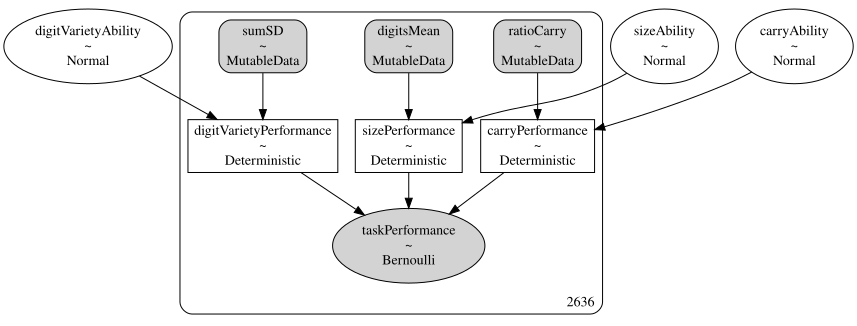

In [ ]:
LLM = 'GPT-3.5-turbo'

model = setupSumModel(train_dict[LLM])
g = pm.model_to_graphviz(model)
g.render(filename='/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/mes_layout', format='png')
g

#### Prior predictive check

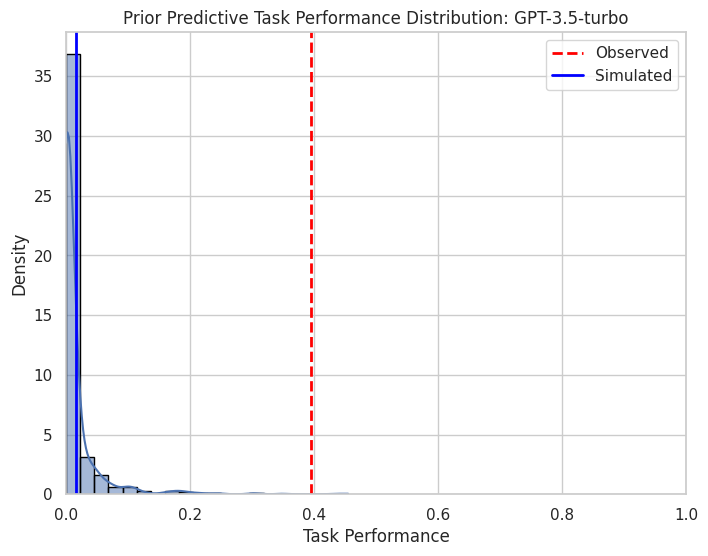

In [ ]:
with model:
    prior_predictive = pm.sample_prior_predictive(samples=1_000)

process_predictive_data_and_plot_histogram(prior_predictive,'prior',save=True)

#### Draw samples from the posterior

In [ ]:
with model:
  trace = pm.sample(draws = 3000, tune = 2000, target_accept=0.99)

/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


#### Posterior predictive check

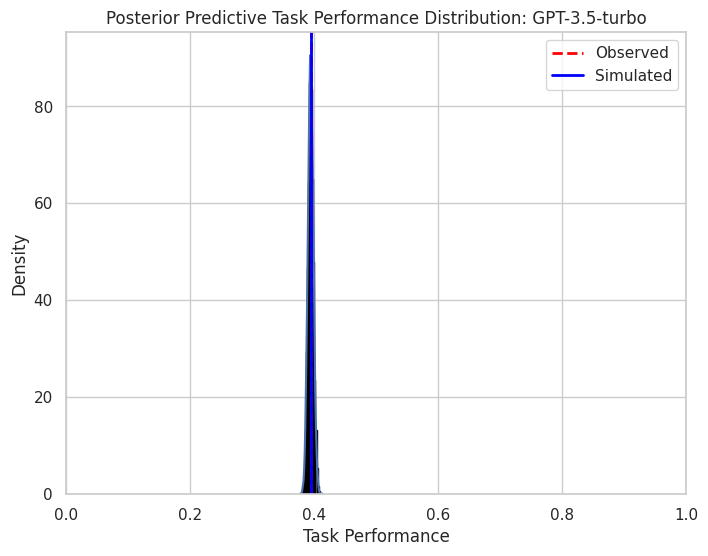

In [ ]:
with model:
  posterior_predictive = pm.sample_posterior_predictive(trace=trace)

process_predictive_data_and_plot_histogram(posterior_predictive,'posterior',save=True)

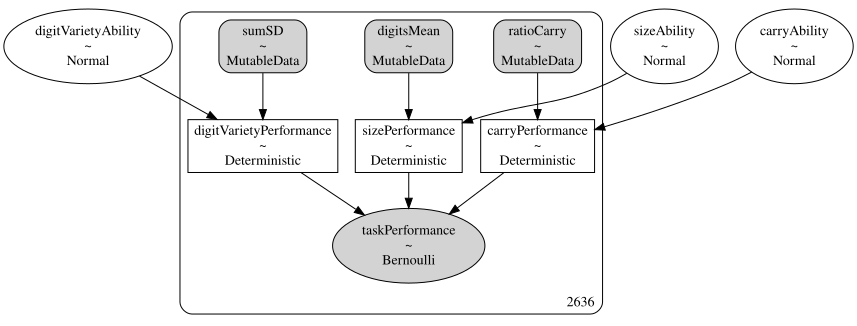

In [ ]:
LLM = 'GPT-3 Ada'

model_ada = setupSumModel(train_dict[LLM])
pm.model_to_graphviz(model_ada)

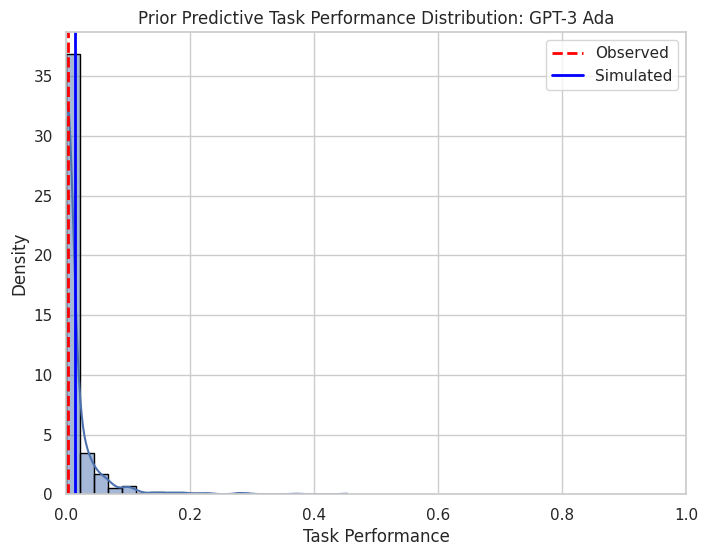

In [ ]:
with model_ada:
    prior_predictive_ada = pm.sample_prior_predictive(samples=1_000)

process_predictive_data_and_plot_histogram(prior_predictive_ada,'prior',save=True)

In [ ]:
with model_ada:
  trace_ada = pm.sample(draws = 3000, tune = 2000, target_accept=0.99)

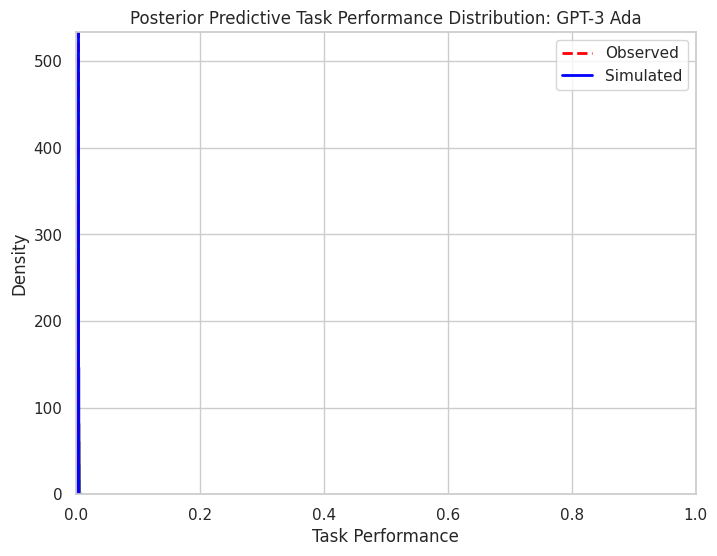

In [ ]:
with model_ada:
  posterior_predictive_ada = pm.sample_posterior_predictive(trace=trace_ada)

process_predictive_data_and_plot_histogram(posterior_predictive_ada,'posterior',save=True)

/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


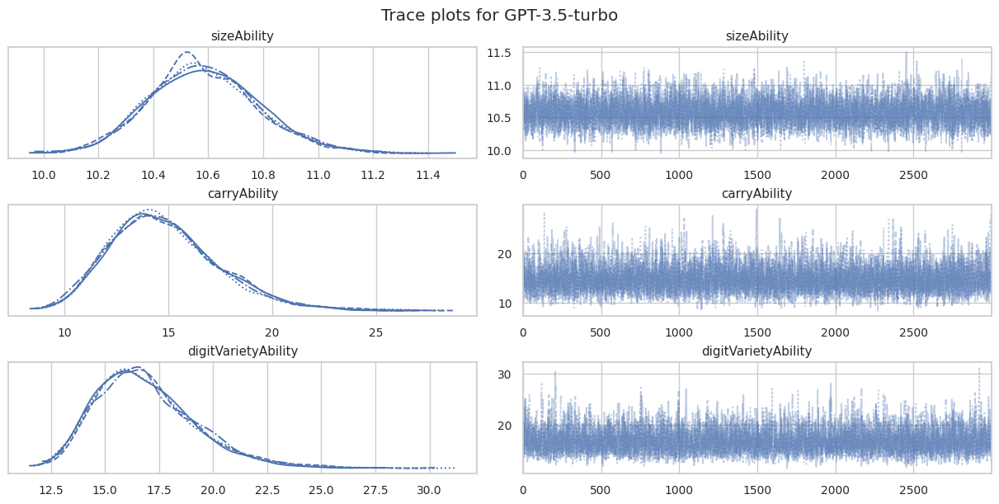

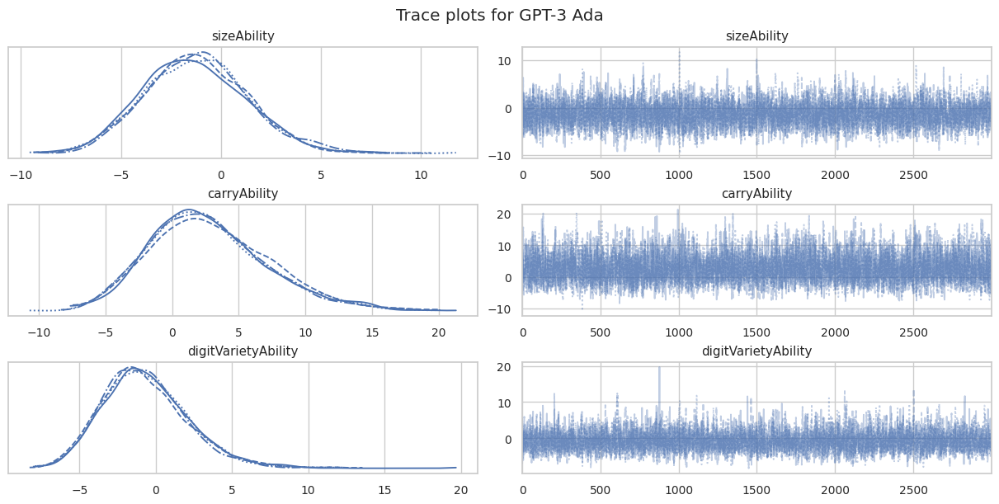

In [ ]:
abilities = ['sizeAbility','carryAbility','digitVarietyAbility']
traces = {}
traces['GPT-3.5-turbo'] = trace
traces['GPT-3 Ada'] = trace_ada

plt.rcParams['figure.constrained_layout.use'] = True

for llm in ['GPT-3.5-turbo','GPT-3 Ada']:
  tr = traces[llm]
  axes = az.plot_trace(data=tr['posterior'][abilities])
  fig = axes.ravel()[0].figure
  fig.suptitle(f"Trace plots for {llm}")
  filename = f"/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/trace_plots_{llm}.png"
  fig.savefig(filename, dpi=300, bbox_inches='tight')
  plt.show()

<ipython-input-71-524d7491abf8>:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()  # Adjust layout to prevent overlap


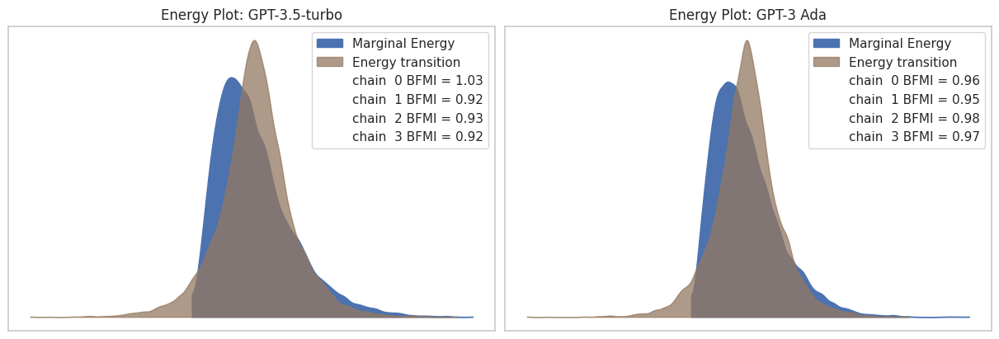

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))  # 1 row, 2 columns

# Plot energy for the first trace
az.plot_energy(data=traces['GPT-3.5-turbo'], ax=axs[0])
axs[0].set_title('Energy Plot: GPT-3.5-turbo')

az.plot_energy(data=traces['GPT-3 Ada'], ax=axs[1])
axs[1].set_title('Energy Plot: GPT-3 Ada')

plt.tight_layout()  # Adjust layout to prevent overlap

filename = "/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/energy_plots_3_5_ada.png"
plt.savefig(filename, dpi=300, bbox_inches='tight')

plt.show()

BFMI stands for Bayesian Fraction of Missing Information and measures the mismatch between two distributions. Empirically, BFMI values below 0.3 have been shown to be problematic. (see Chapter 6.1 [here](https://arxiv.org/pdf/1701.02434.pdf)).

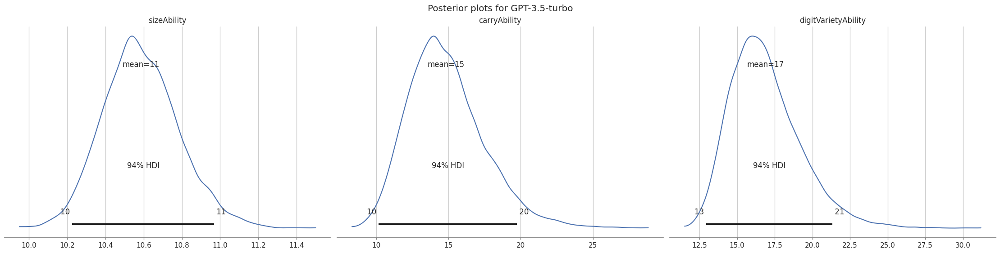

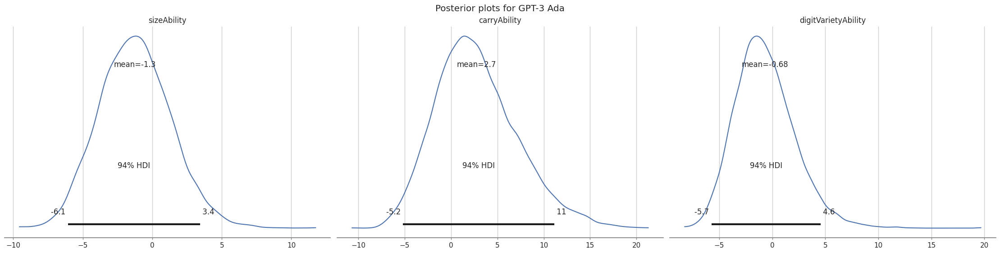

In [ ]:
for llm in ['GPT-3.5-turbo','GPT-3 Ada']:
  tr = traces[llm]
  axes = az.plot_posterior(data=tr['posterior'][abilities])
  fig = axes.ravel()[0].figure
  fig.suptitle(f"Posterior plots for {llm}")
  filename = f"/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/posterior_plots_{llm}.png"
  fig.savefig(filename, dpi=300, bbox_inches='tight')
  plt.show()


In [ ]:
summary = az.summary(trace['posterior'][abilities],round_to=3)
print('Summary statistics: GPT-3.5-turbo')
summary[['mean','sd','hdi_3%','hdi_97%','ess_bulk','ess_tail','r_hat']]

Summary statistics: GPT-3.5-turbo


,mean,sd,hdi_3%,hdi_97%,ess_bulk,ess_tail,r_hat
sizeAbility,10.585,0.198,10.227,10.968,5746.943,5346.377,1.001
carryAbility,14.839,2.652,10.175,19.743,6126.873,4941.861,1.001
digitVarietyAbility,16.887,2.336,12.949,21.330,4821.880,4500.382,1.001


In [ ]:
summary = az.summary(trace_ada['posterior'][abilities],round_to=3)
print('Summary statistics: GPT-3 Ada')
summary[['mean','sd','hdi_3%','hdi_97%','ess_bulk','ess_tail','r_hat']]

Summary statistics: GPT-3 Ada


,mean,sd,hdi_3%,hdi_97%,ess_bulk,ess_tail,r_hat
sizeAbility,-1.252,2.569,-6.075,3.425,4289.046,4371.565,1.001
carryAbility,2.739,4.415,-5.183,11.158,4434.910,4728.066,1.001
digitVarietyAbility,-0.685,2.822,-5.737,4.564,4432.195,4482.631,1.000


#### Use the meaasurmet layout to predict performance of LLMs on training data

Here we calculate performance scores of each measurement layout on the training set.

In [ ]:
for llm in ['GPT-3.5-turbo','GPT-3 Ada']:
  print(f'\n{llm}')
  model_initialize = setupSumModel(test_dict[llm])

  predictions = predict(model_initialize, traces[llm], test_dict[llm], var_name = 'taskPerformance')

  modelBrierScore = brier_score_loss(test_dict[llm]["success"], predictions)
  average_success_on_train_score = brier_score_loss(test_dict[llm]["success"],np.mean(train_dict[llm]["success"]) * np.ones_like(test_dict[llm]["success"]))
  roc_auc = roc_auc_score(test_dict[llm]["success"], predictions)

  print(f'Brier Score: {modelBrierScore:.3f}, '
          f'Average success on train Brier score: {average_success_on_train_score:.3f}, '
          f'AUROC: {roc_auc:.3f}')


GPT-3.5-turbo


Brier Score: 0.119, Average success on train Brier score: 0.240, AUROC: 0.910

GPT-3 Ada


Brier Score: 0.001, Average success on train Brier score: 0.002, AUROC: 0.971


### Build a measurment layout for each LLM


GPT-3 Ada


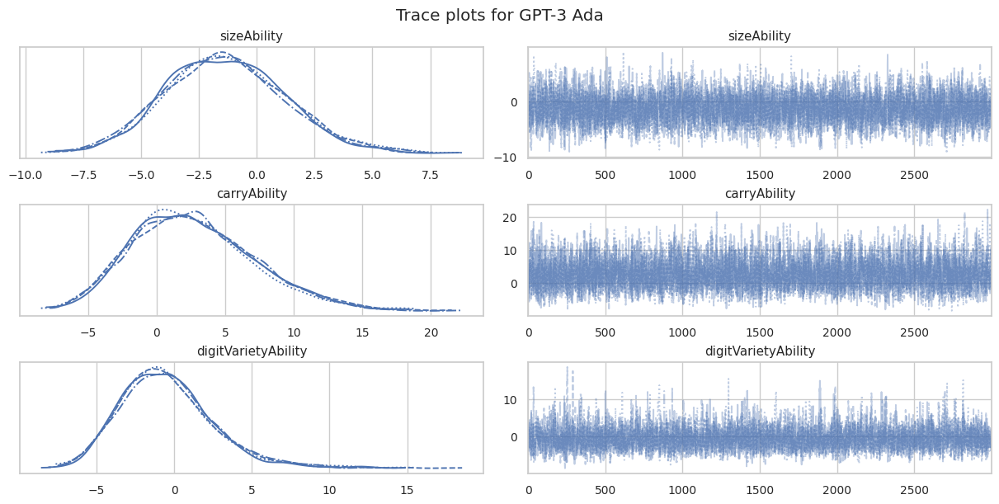

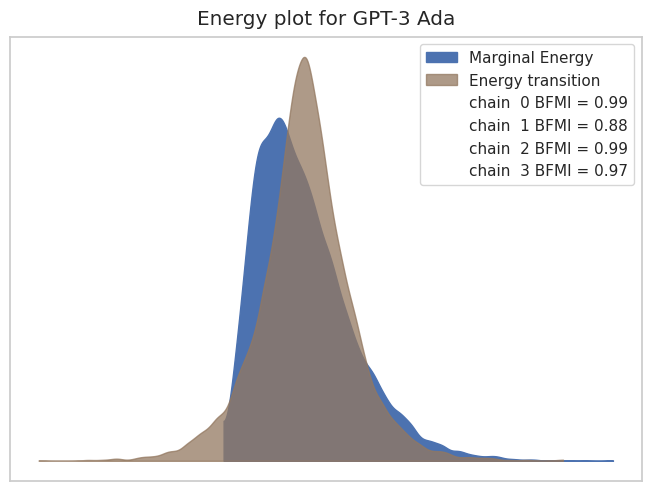

              mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
sizeAbility -1.343  2.597  -6.439    3.317  4498.985  4433.078  1.001
               mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
carryAbility  2.712  4.454  -5.096    11.34  5223.856  5411.293    1.0
                      mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
digitVarietyAbility -0.459  3.066   -5.72    5.278  4185.243  3874.632    1.0


{'BrierScore': 0.0015020384680134679, 'AUROC': 0.952959028831563}

GPT-3 Babbage


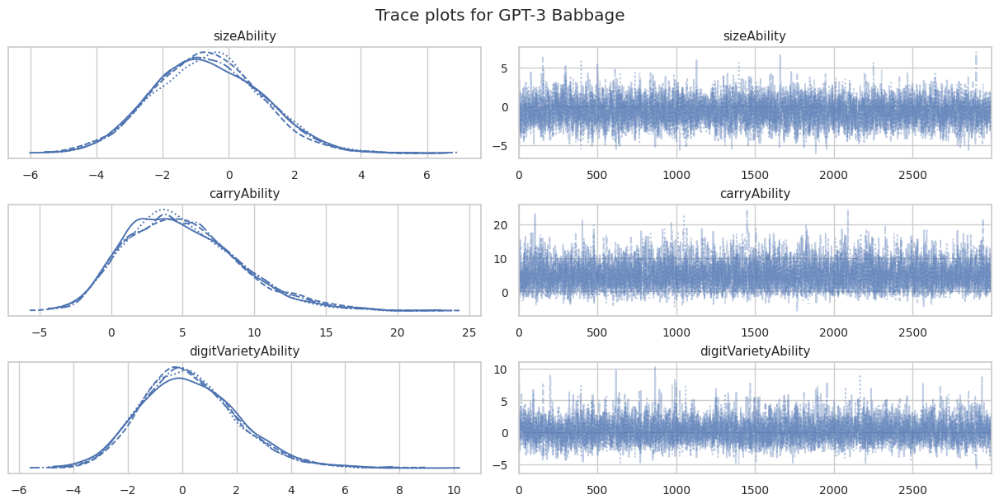

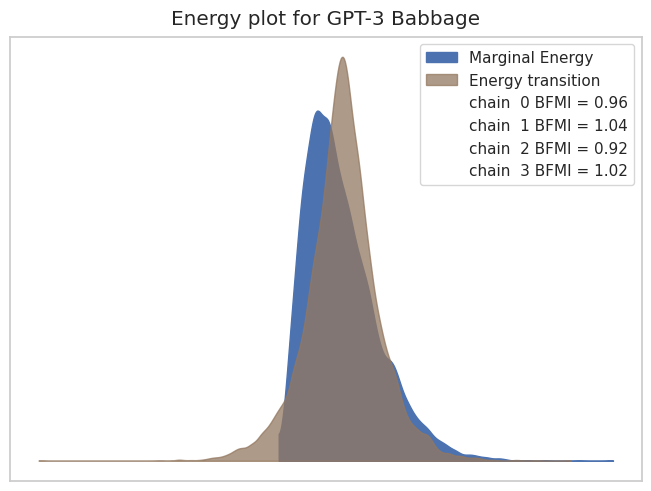

              mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
sizeAbility -0.635  1.635  -3.596    2.477   4267.57   4854.43  1.002
               mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
carryAbility  5.008  3.897  -1.747    12.31  4414.343  4259.494  1.001
                      mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
digitVarietyAbility  0.289  1.812  -2.852    3.809  4199.861  4260.734  1.001


{'BrierScore': 0.00429575787037037, 'AUROC': 0.9639776763064435}

GPT-3 Curie


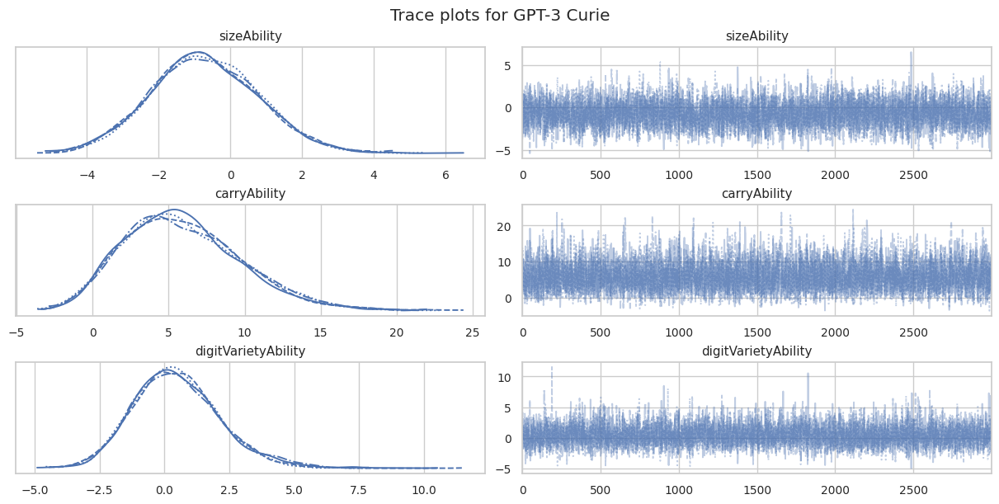

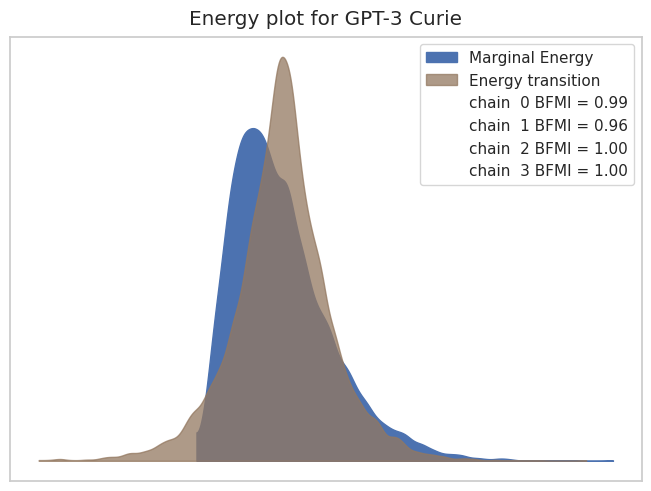

              mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
sizeAbility -0.707  1.494  -3.575    2.028  4326.282  4850.581    1.0
               mean    sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
carryAbility  5.944  3.91  -0.845   13.283  4959.339  4330.477  1.001
                      mean    sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
digitVarietyAbility  0.467  1.67  -2.566    3.612   4645.46   4959.82    1.0


{'BrierScore': 0.014461145854377105, 'AUROC': 0.9808796750245132}

GPT-3 Davinci


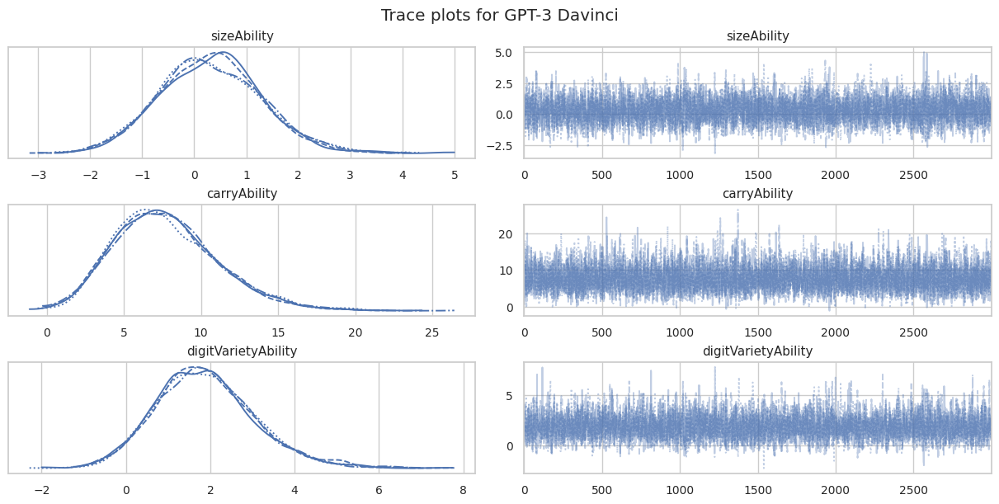

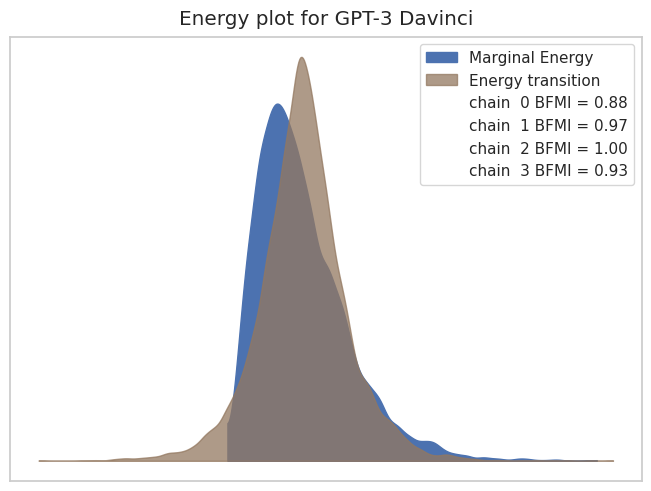

              mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
sizeAbility  0.316  0.985  -1.555    2.122  4422.249  4616.055  1.001
               mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
carryAbility  7.737  3.392   2.004   14.472  5512.185  4857.278    1.0
                      mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
digitVarietyAbility  1.884  1.178  -0.234    4.148  4336.236  4424.901    1.0


{'BrierScore': 0.021758710711279463, 'AUROC': 0.9678521979923849}

text-davinci-001


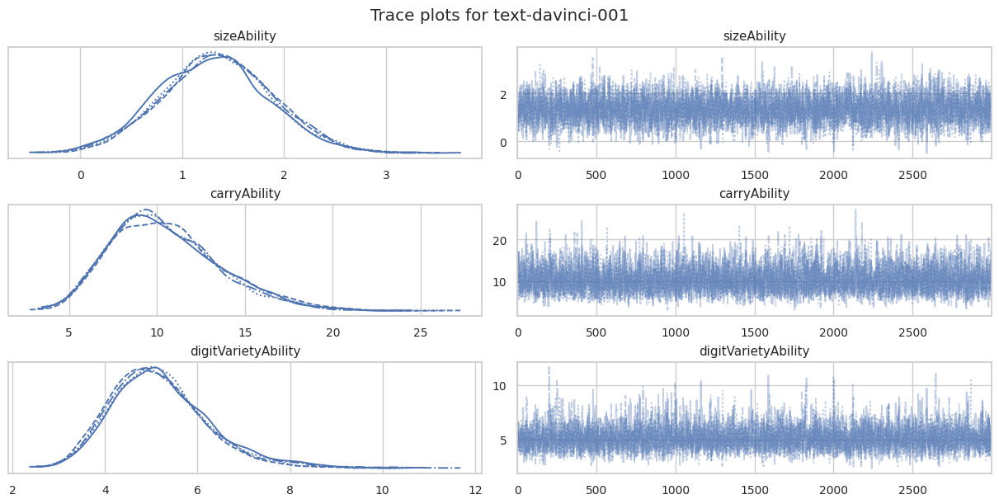

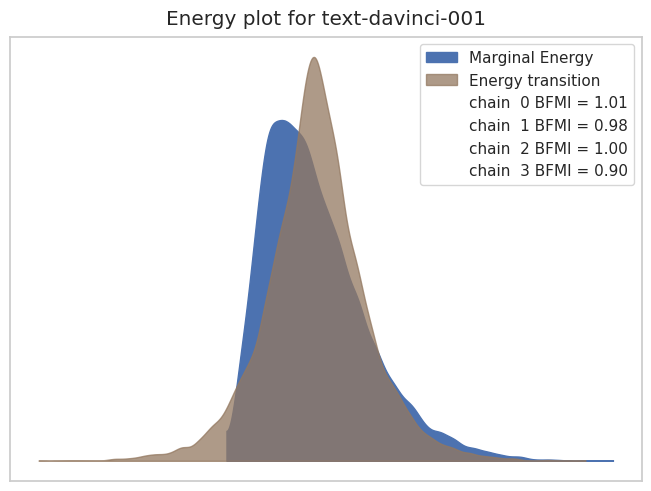

              mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
sizeAbility  1.338  0.545   0.304    2.361  3978.109   4799.51  1.002
                mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
carryAbility  10.494  3.111   5.355   16.683  4826.458  4416.341  1.001
                      mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
digitVarietyAbility  5.183  1.074   3.334    7.207  4042.979  3612.911  1.002


{'BrierScore': 0.02811666748737374, 'AUROC': 0.9622057752972579}

text-davinci-002


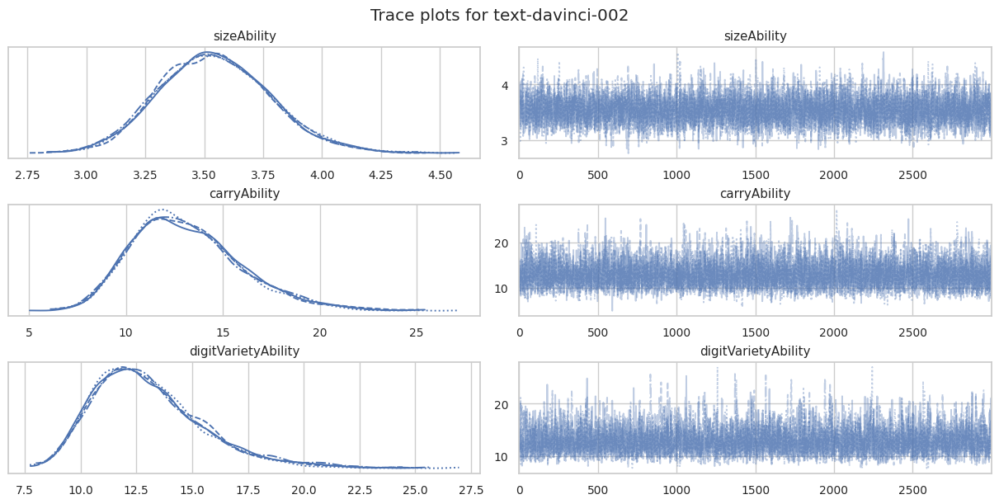

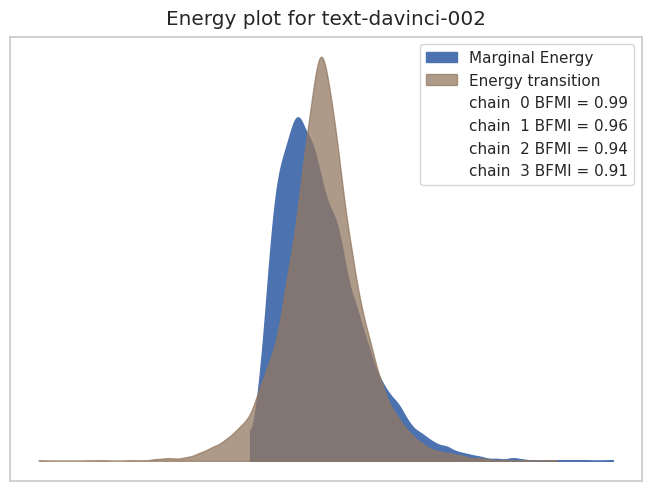

              mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
sizeAbility  3.548  0.237   3.109    3.996  5163.584  5466.039    1.0
                mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
carryAbility  13.152  2.812   8.336   18.567  5874.716  4886.958  1.002
                       mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
digitVarietyAbility  13.043  2.487   8.955   17.725  4165.493  3805.924  1.001


{'BrierScore': 0.048413853703703706, 'AUROC': 0.981832358674464}

text-davinci-003


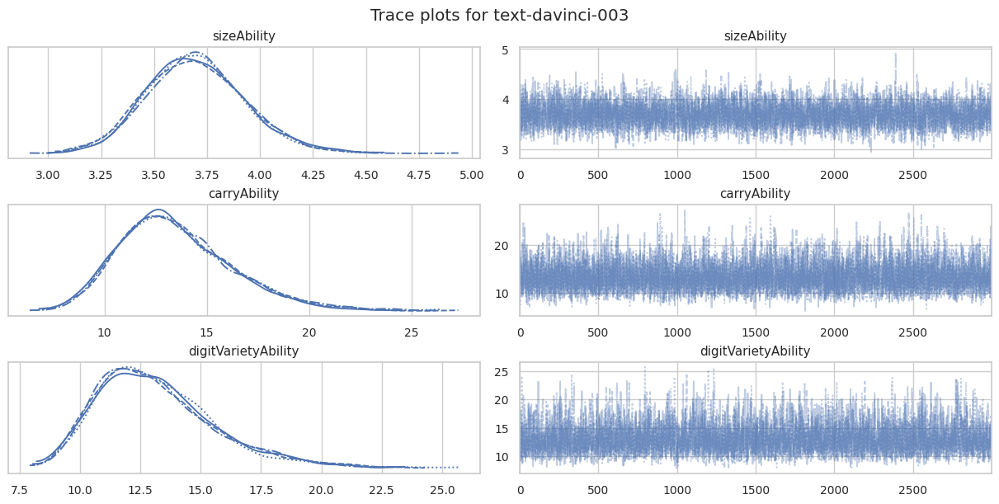

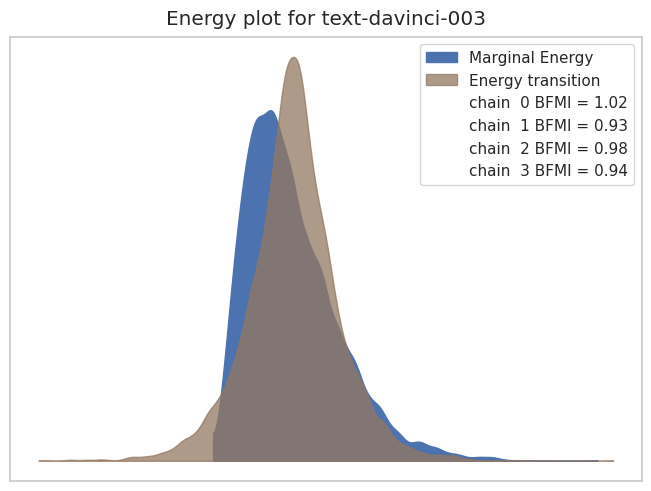

              mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
sizeAbility  3.696  0.231   3.278    4.144  4737.856  4706.722  1.001
                mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
carryAbility  13.509  2.778   8.718   18.844   5922.35  4829.169  1.002
                       mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
digitVarietyAbility  13.173  2.487   8.965    17.86  3918.935  4393.516    1.0


{'BrierScore': 0.05196379780092592, 'AUROC': 0.9725313733269298}

GPT-4-0314


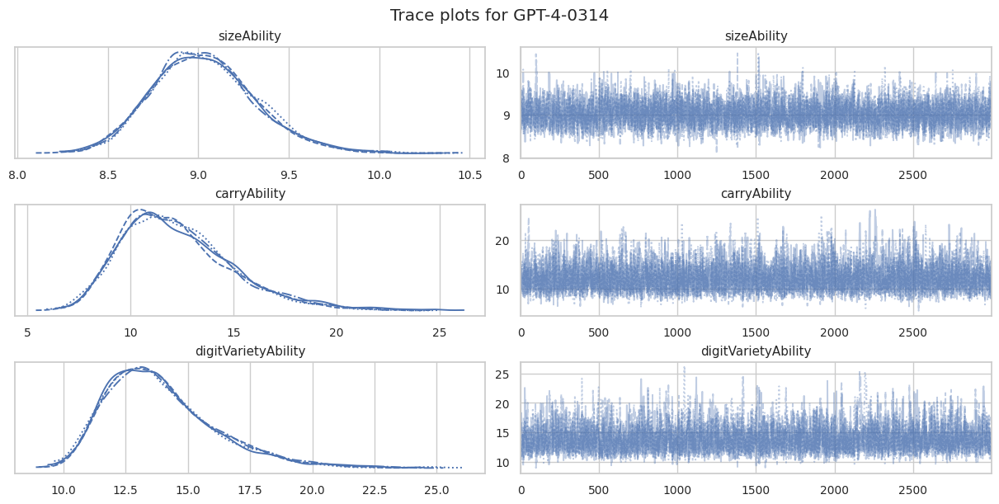

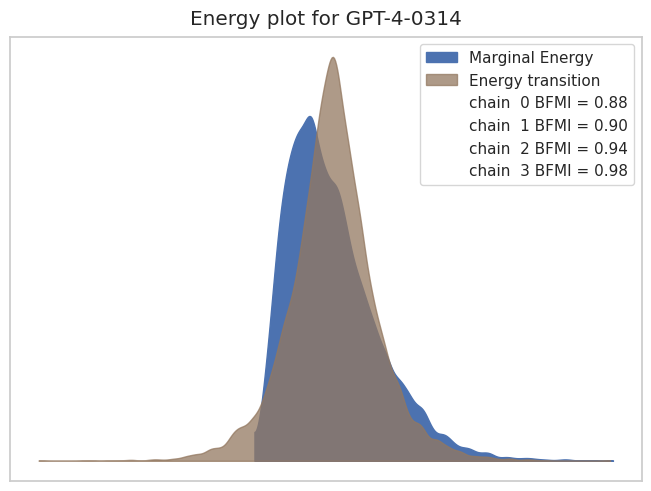

              mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
sizeAbility  9.036  0.286     8.5    9.565  3589.105  4003.518  1.001
               mean    sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
carryAbility  12.31  2.75   7.679   17.475  4773.185   3827.45  1.001
                       mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
digitVarietyAbility  13.942  2.257  10.403   18.278   3006.98  2697.055  1.001


{'BrierScore': 0.13664697955597643, 'AUROC': 0.8228710255784594}

GPT-3.5-turbo


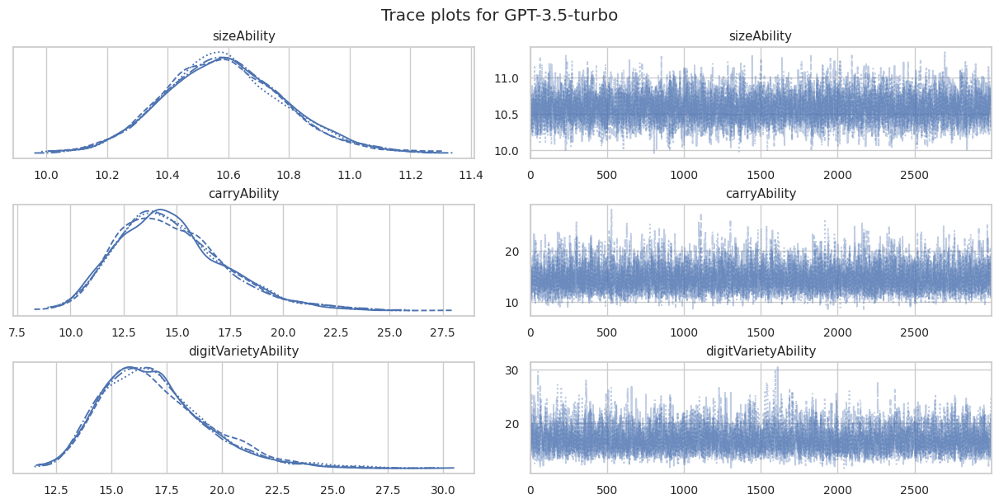

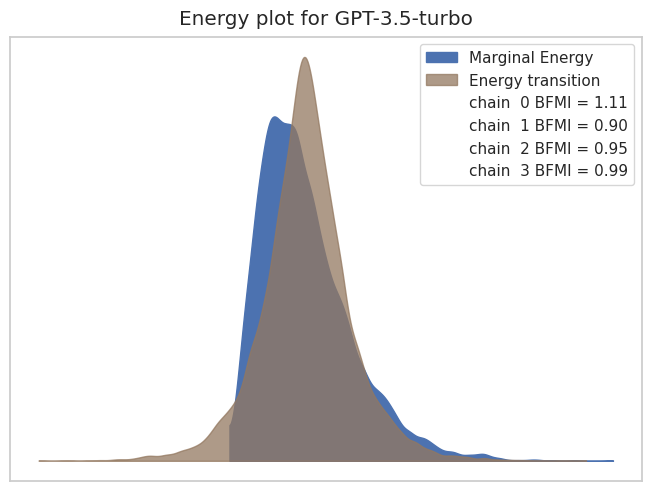

               mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
sizeAbility  10.588  0.199  10.208   10.961  5088.514  5161.921  1.001
               mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
carryAbility  14.78  2.593  10.262   19.612   5734.96   5162.67    1.0
                       mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
digitVarietyAbility  16.953  2.385  13.104   21.567  4352.323  4721.511  1.001


{'BrierScore': 0.1187239650462963, 'AUROC': 0.9091052571166208}

GPT-4-0613


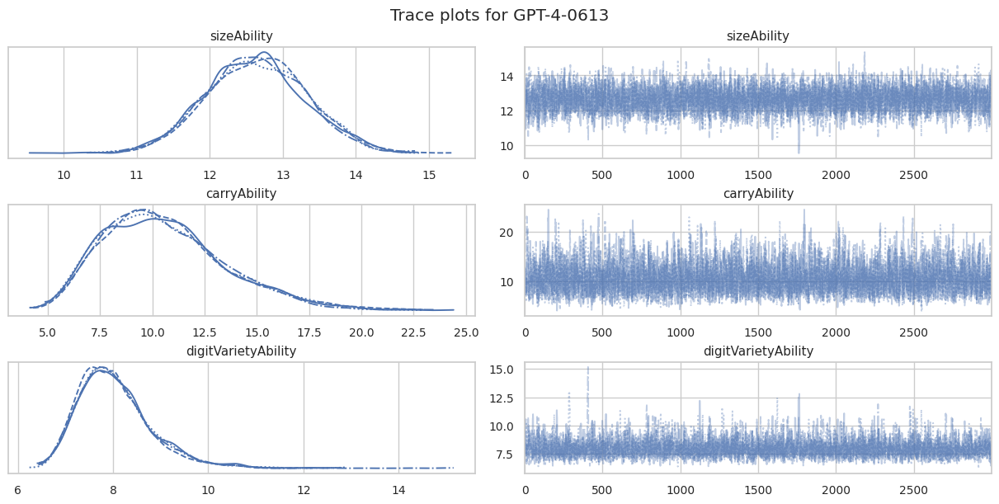

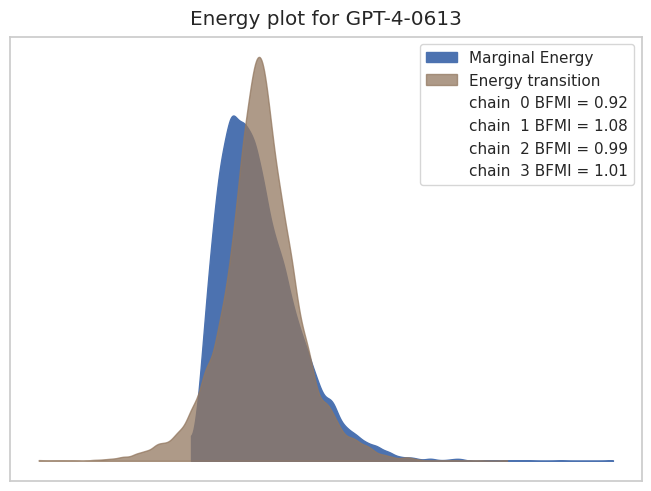

               mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
sizeAbility  12.638  0.682  11.342   13.887  3951.369  4506.992  1.001
                mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
carryAbility  10.639  3.008   5.773   16.416  3837.764  4128.004  1.001
                      mean     sd  hdi_3%  hdi_97%  ess_bulk  ess_tail  r_hat
digitVarietyAbility  8.042  0.785   6.757    9.497  3581.884  3887.807  1.001


{'BrierScore': 0.1624119763678451, 'AUROC': 0.8268792933290339}


In [ ]:
scores_dict = {}
metrics_dict = {}
probabilities = {}
list_features = ['harm_mean','carry_art_mean_ratio','sum_sd']
abilities = ['sizeAbility','carryAbility','digitVarietyAbility']
predictive_methods_df_mes_lay = pd.DataFrame()

for llm in llms:
    print(f'\n{llm}')

    m_llm = setupSumModel(train_dict[llm])

    with m_llm:
      llm_trace = pm.sample(draws = 3000, tune = 2000, target_accept=0.99)

    #Save the trace
    #llm_trace.to_netcdf(f"/content/drive/MyDrive/Colab Notebooks/Addition_data/Traces/trace_addition_data_{llm}.nc")

    # Plot the trace plot on the first subplot
    axes = az.plot_trace(data=llm_trace['posterior'][abilities])
    fig = axes.ravel()[0].figure
    fig.suptitle(f"Trace plots for {llm}")
    filename = f"/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/trace_plots_{llm}.png"
    fig.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

    axes = az.plot_energy(data=llm_trace)
    fig = axes.figure
    fig.suptitle(f"Energy plot for {llm}")
    filename = f"/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/energy_plots_{llm}.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

    metrics_dict[llm] = {}

    for ability in abilities:

        summary = az.summary(llm_trace['posterior'][ability], round_to=3)

        metrics_dict[llm][ability] = {
                'mean': summary['mean'][0],
                'hdi_3%': summary['hdi_3%'][0],
                'hdi_97%': summary['hdi_97%'][0],
                'ess_bulk': summary['ess_bulk'][0],
                'ess_tail': summary['ess_tail'][0],
                'r_hat': summary['r_hat'][0],
        }
        print(summary[['mean','sd','hdi_3%','hdi_97%','ess_bulk','ess_tail','r_hat']])

    m_llm = setupSumModel(test_dict[llm])

    predictions = predict(m_llm, llm_trace, test_dict[llm][list_features], var_name='taskPerformance')

    probabilities[llm] = predictions

    modelBrierScore = brier_score_loss(test_dict[llm]["success"], predictions)
    roc_auc = roc_auc_score(test_dict[llm]['success'], predictions)


    scores_dict[llm] = {'BrierScore': modelBrierScore,'AUROC':roc_auc}
    print(scores_dict[llm])

    predictive_methods_df_mes_lay = pd.concat([predictive_methods_df_mes_lay, pd.DataFrame({"predictive_method": 'Measurement layout', "llm": llm, "BrierScore": modelBrierScore,"AUROC": roc_auc}, index=[0])])


In [ ]:
#save scores
predictive_methods_mes_lay_combined_df = pd.concat([predictive_methods_df,predictive_methods_df_mes_lay])
predictive_methods_mes_lay_combined_df.to_pickle("/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/predictive_methods_mes_lay.pkl")

#### Load taces and plot (in case not done above)


 GPT-3 Ada


/usr/local/lib/python3.10/dist-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


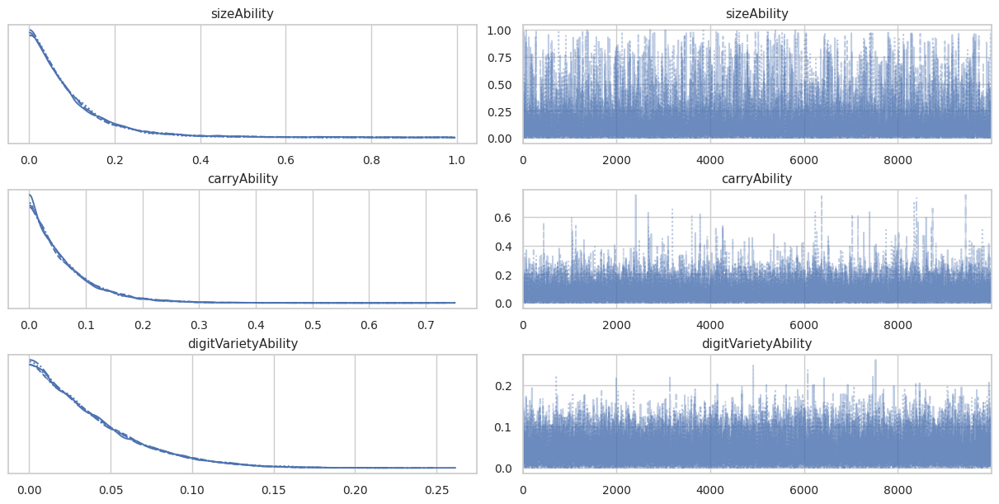

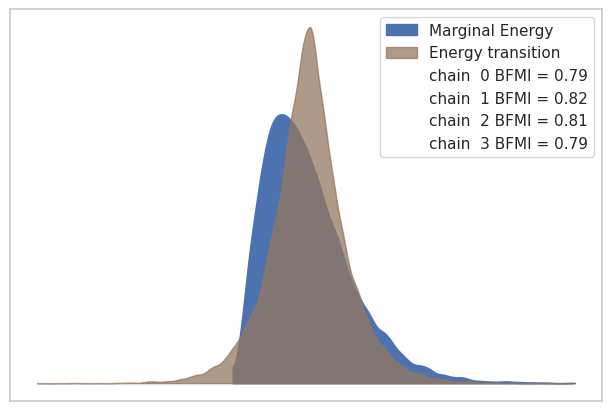


 GPT-3 Babbage


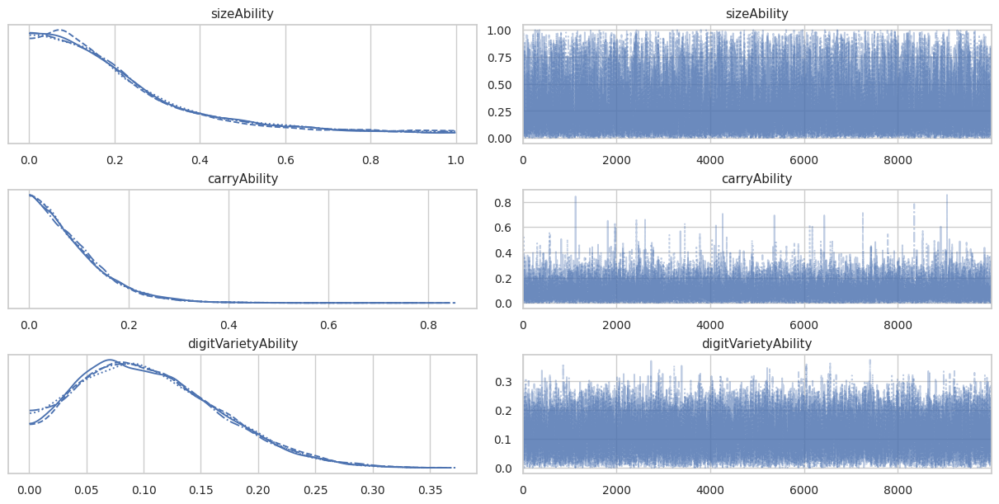

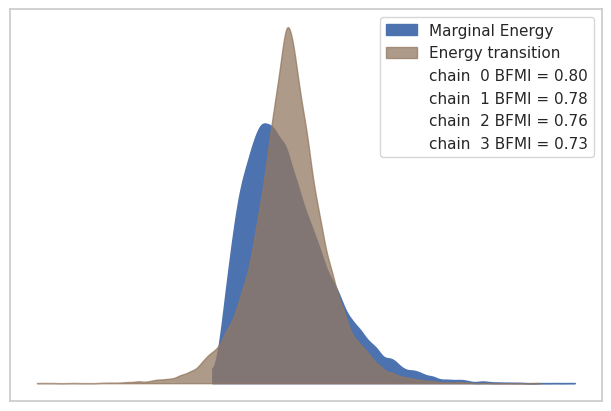


 GPT-3 Curie


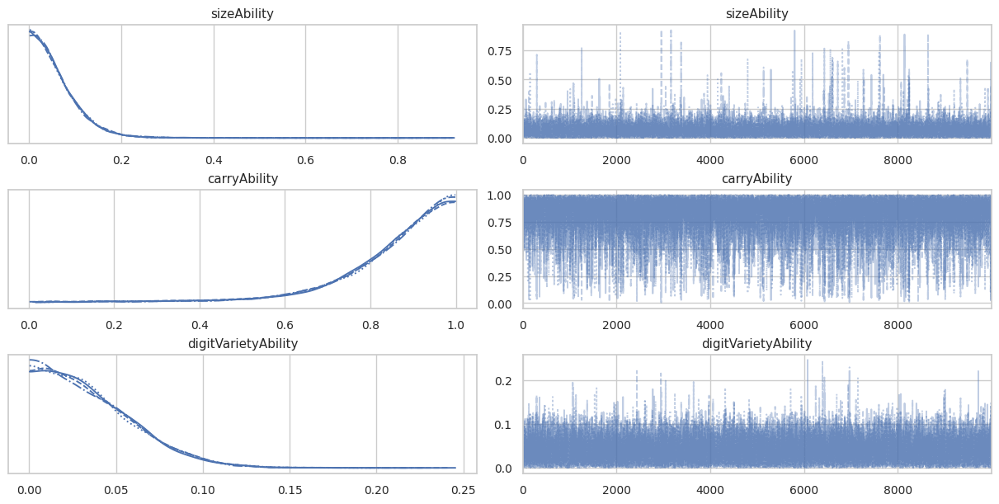

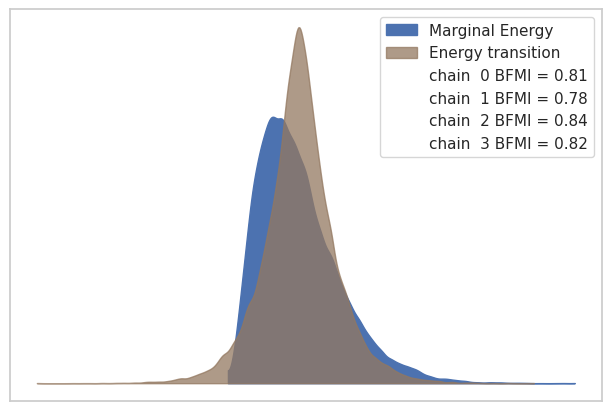


 GPT-3 Davinci


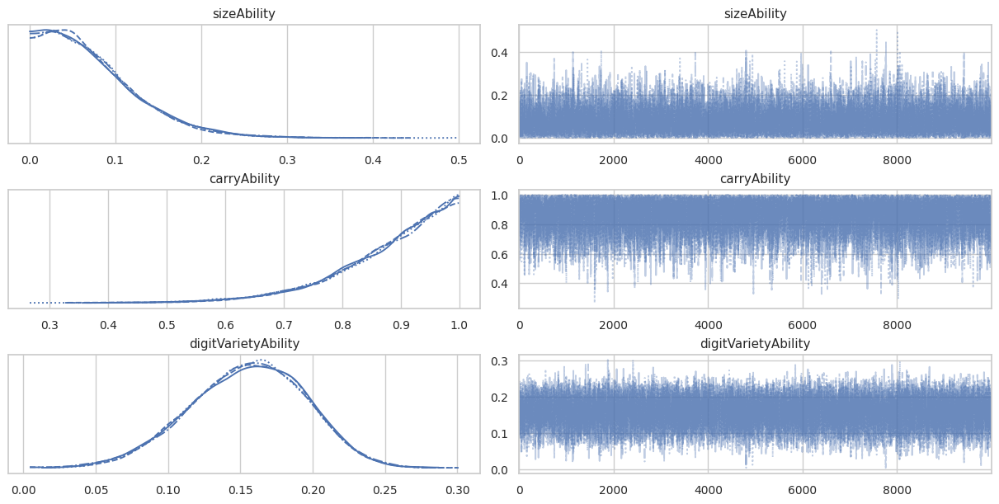

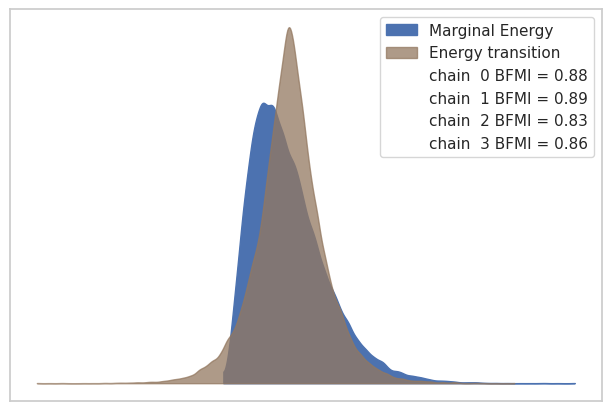


 text-davinci-001


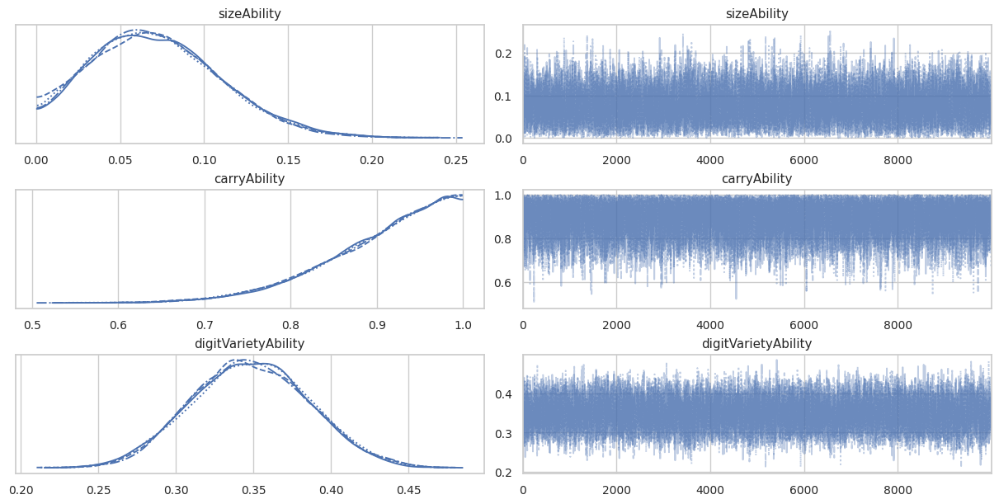

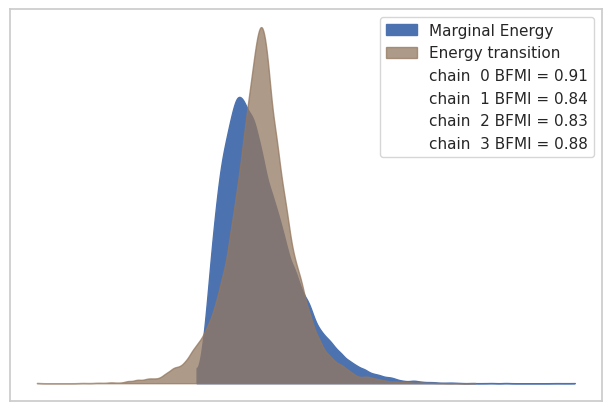


 text-davinci-002


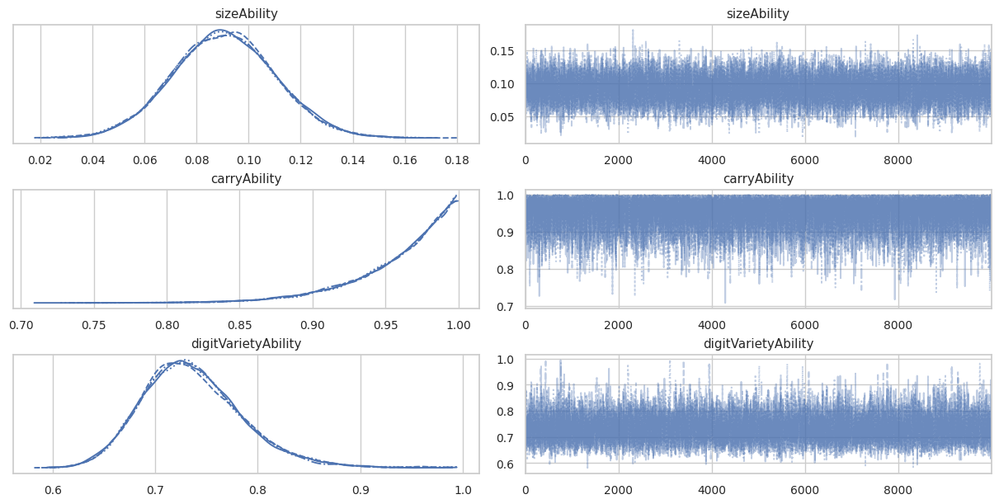

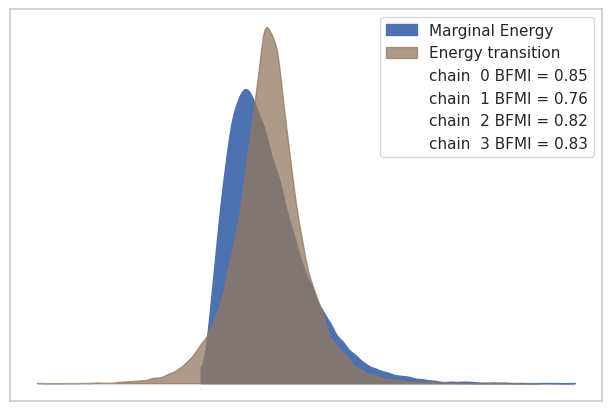


 text-davinci-003


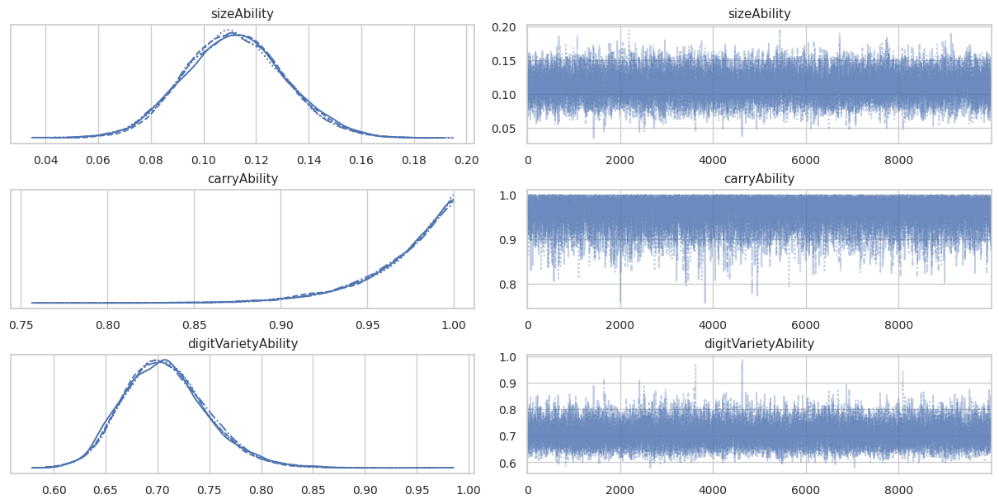

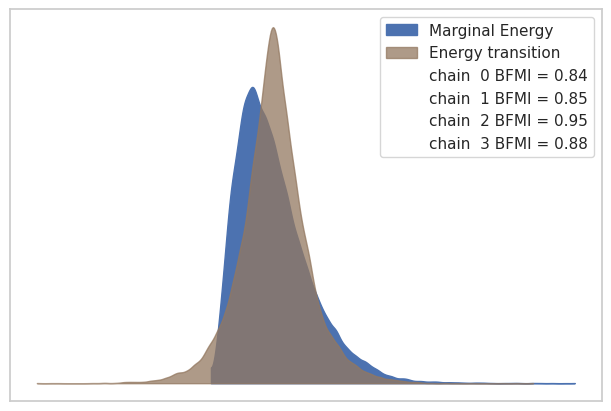


 GPT-4-0314


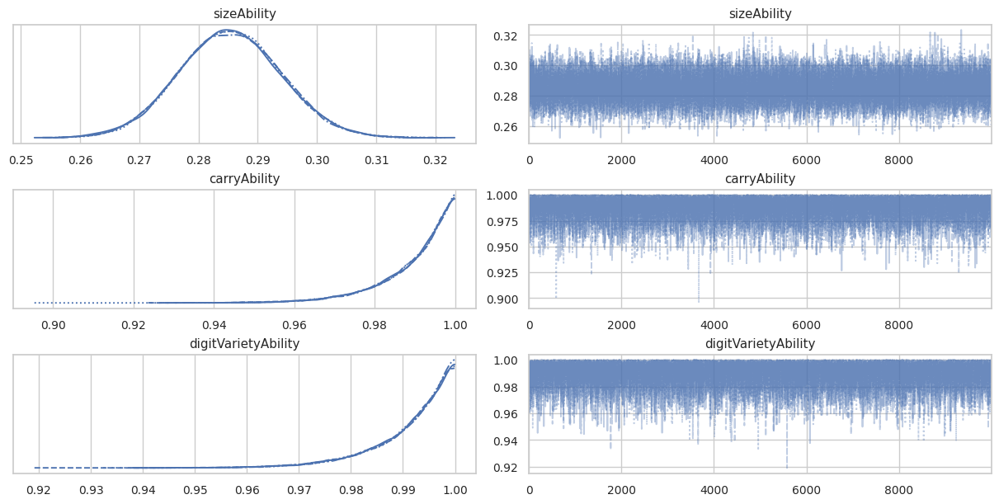

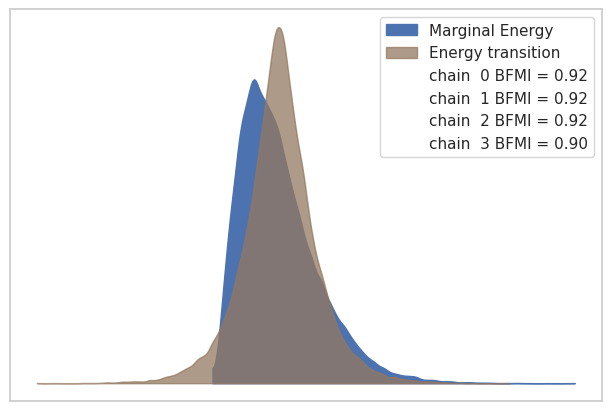


 GPT-3.5-turbo


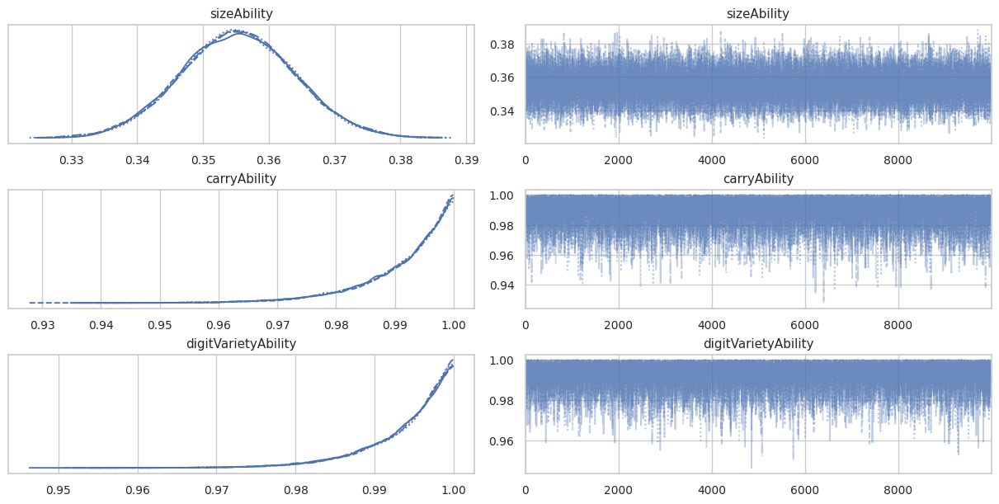

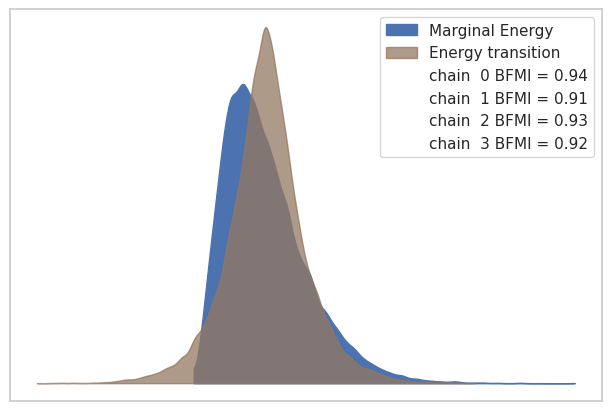


 GPT-4-0613


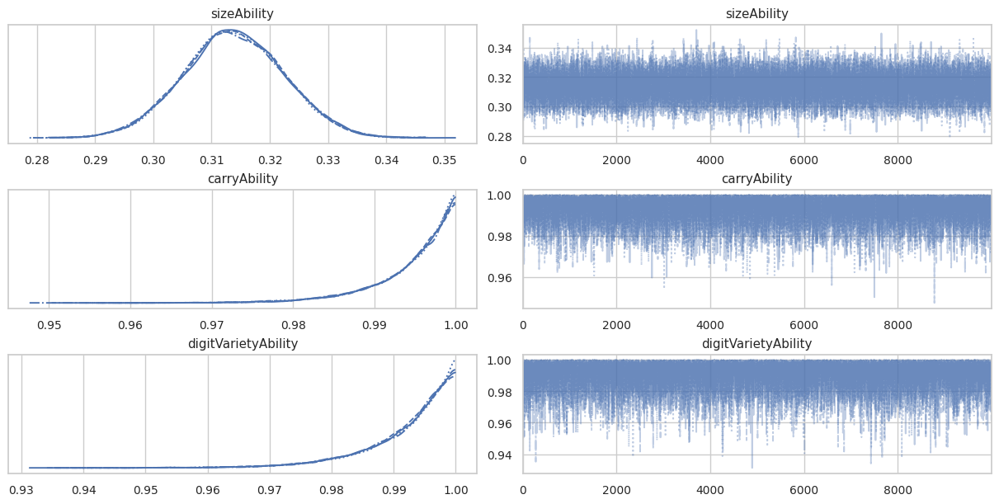

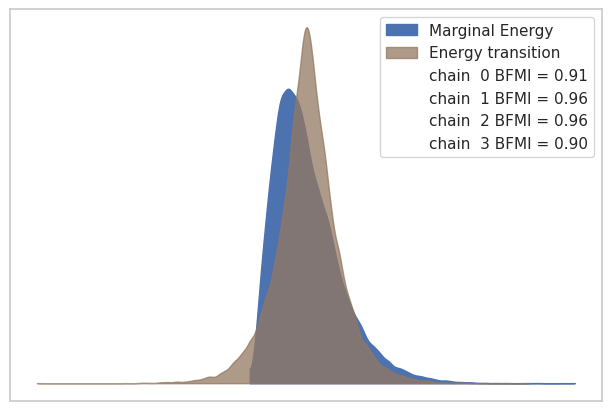

In [ ]:
scores_dict = {}
metrics_dict = {}
probabilities = {}
list_features = ['harm_mean_scaled','sum_sd_scaled','carry_art_mean_ratio_scaled']
abilities = ['sizeAbility','carryAbility','digitVarietyAbility']
predictive_methods_df_mes_lay = pd.DataFrame()

for llm in llms:
    print(f'\n {llm}')
    #Load the trace
    with az.rc_context(rc={"data.load": "eager"}):
      llm_trace = az.from_netcdf(f"/content/drive/MyDrive/Colab Notebooks/Addition_data/Traces/trace_addition_data_{llm}.nc")

    # Plot the trace plot on the first subplot
    az.plot_trace(data=llm_trace['posterior'][abilities])
    plt.rcParams['figure.constrained_layout.use'] = True
    fig, ax = plt.subplots(figsize=(6, 4))
    # Plot the energy plot on the second subplot
    az.plot_energy(data=llm_trace, ax=ax)
    plt.show()

    metrics_dict[llm] = {}

    for ability in abilities:

        summary = az.summary(llm_trace['posterior'][ability], round_to=3)

        metrics_dict[llm][ability] = {
                'mean': summary['mean'][0],
                'hdi_3%': summary['hdi_3%'][0],
                'hdi_97%': summary['hdi_97%'][0],
                'ess_bulk': summary['ess_bulk'][0],
                'ess_tail': summary['ess_tail'][0],
                'r_hat': summary['r_hat'][0],
        }

    m_llm = setupSumModel(test_dict[llm])

    predictions = predict(m_llm, llm_trace, test_dict[llm][list_features])

    probabilities[llm] = predictions

    modelBrierScore, modelCalibration, modelRefinement = brierDecomp(predictions, test_dict[llm]['success'])
    roc_auc = roc_auc_score(test_dict[llm]['success'], predictions)
    ap = average_precision_score(test_dict[llm]['success'], predictions)


    scores_dict[llm] = {'BrierScore': modelBrierScore, 'Calibration':modelCalibration,'Refinement':modelRefinement,'AUROC':roc_auc}

    predictive_methods_df_mes_lay = pd.concat([predictive_methods_df_mes_lay, pd.DataFrame({"predictive_method": 'Measurement layout', "llm": llm, "BrierScore": modelBrierScore, "Calibration": modelCalibration, "Refinement": modelRefinement, "AUROC": roc_auc}, index=[0])])

In [ ]:
#save scores
predictive_methods_mes_lay_combined_df = pd.concat([predictive_methods_df,predictive_methods_df_mes_lay])
predictive_methods_mes_lay_combined_df.to_pickle("/content/drive/MyDrive/Colab Notebooks/Addition_data/predictive_methods_mes_lay.pkl")

#### Convergence metrics

In [ ]:
data_for_df = []
for llm, abilities in metrics_dict.items():
    for ability, metrics in abilities.items():
        row = (llm, ability, metrics.get('ess_bulk'), metrics.get('ess_tail'), metrics.get('r_hat'))
        data_for_df.append(row)

# Creating the DataFrame
df = pd.DataFrame(data_for_df, columns=['LLM', 'Ability', 'ess_bulk', 'ess_tail', 'r_hat'])

# Setting LLM and Ability as the index if desired
df.set_index(['LLM', 'Ability'], inplace=True)

# Display the DataFrame
print(df)

                                      ess_bulk  ess_tail  r_hat
LLM              Ability                                       
GPT-3 Ada        sizeAbility          4498.985  4433.078  1.001
                 carryAbility         5223.856  5411.293  1.000
                 digitVarietyAbility  4185.243  3874.632  1.000
GPT-3 Babbage    sizeAbility          4267.570  4854.430  1.002
                 carryAbility         4414.343  4259.494  1.001
                 digitVarietyAbility  4199.861  4260.734  1.001
GPT-3 Curie      sizeAbility          4326.282  4850.581  1.000
                 carryAbility         4959.339  4330.477  1.001
                 digitVarietyAbility  4645.460  4959.820  1.000
GPT-3 Davinci    sizeAbility          4422.249  4616.055  1.001
                 carryAbility         5512.185  4857.278  1.000
                 digitVarietyAbility  4336.236  4424.901  1.000
text-davinci-001 sizeAbility          3978.109  4799.510  1.002
                 carryAbility         48

#### Visualise abilities

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
<ipython-input-79-5ef1d7e99a87>:32: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  g.fig.subplots_adjust(top=0.9)


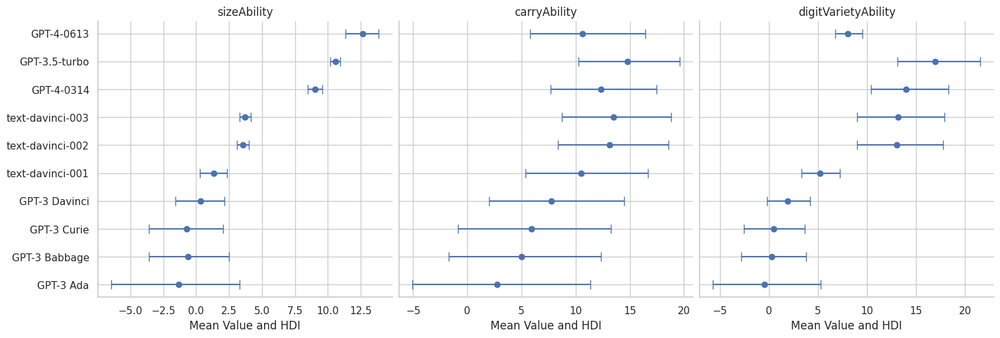

In [ ]:
# Prepare the DataFrame from the provided dictionary
rows = []
for model, abilities in metrics_dict.items():
    for ability, stats in abilities.items():
        rows.append({
            'LLM': model,
            'Ability': ability,
            'Mean': stats['mean'],
            'Lower': stats['hdi_3%'],
            'Upper': stats['hdi_97%']
        })
df = pd.DataFrame(rows)

# Define a custom plotting function for use with FacetGrid
def plot_with_errorbars(data, **kwargs):
    # Calculate the error terms as positive and negative deviations from the mean
    errors = [data['Mean'] - data['Lower'], data['Upper'] - data['Mean']]
    y_positions = range(len(data))  # Y positions for each LLM

    # Plotting the mean with error bars on the y-axis
    plt.errorbar(data['Mean'], y_positions, xerr=errors, fmt='o', capsize=5, **kwargs)
    plt.yticks(y_positions, data['LLM'])  # Set LLM names as y-ticks
    #plt.xlim(0, 1)

# Create a FacetGrid to plot a separate subplot for each ability
g = sns.FacetGrid(df, col="Ability", sharex=False, sharey=True, height=5, aspect=1)
g.map_dataframe(plot_with_errorbars)

# Adjusting the FacetGrid
g.set_axis_labels("Mean Value and HDI", "")
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(top=0.9)


filename = f"/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/trace_plots_mes_layout_abilities.png"
g.savefig(filename, dpi=300, bbox_inches='tight')

plt.show()


In [ ]:
! pip install -U kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 15.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.


In [ ]:
import plotly.graph_objects as go

categories = ['sizeAbility','carryAbility','digitVarietyAbility']
categories.append(categories[0])
fig = go.Figure()

for llm, abilities in metrics_dict.items():
      mean_abilities = [abilities[cat]['mean'] for cat in categories[:-1]]
      mean_abilities.append(mean_abilities[0])

      fig.add_trace(go.Scatterpolar(
            r=mean_abilities,
            theta=categories,
            #fill='toself',
            name=llm
      ))

fig.update_layout(
      polar=dict(
        radialaxis=dict(
          visible=True,
        )),
      showlegend=True
    )

fig.show()

#fig.write_image("/content/drive/MyDrive/Colab Notebooks/Addition_data/Plots/spiderlot.png")

#### Compare predictive performance to common predictive models

In [ ]:
scores_mes_lay = pd.DataFrame.from_dict(scores_dict, orient='index').reset_index()
scores_mes_lay.rename(columns={'index': 'llm'}, inplace=True)
scores_mes_lay.sort_values('BrierScore')

,llm,BrierScore,AUROC
0,GPT-3 Ada,0.001502,0.952959
1,GPT-3 Babbage,0.004296,0.963978
2,GPT-3 Curie,0.014461,0.980880
3,GPT-3 Davinci,0.021759,0.967852
4,text-davinci-001,0.028117,0.962206
5,text-davinci-002,0.048414,0.981832
6,text-davinci-003,0.051964,0.972531
8,GPT-3.5-turbo,0.118724,0.909105
7,GPT-4-0314,0.136647,0.822871
9,GPT-4-0613,0.162412,0.826879


In [ ]:
#load saved scores if needed
predictive_methods_mes_lay_combined_df = pd.read_pickle("/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/predictive_methods_mes_lay.pkl")
predictive_methods_mes_lay_combined_df

,predictive_method,llm,BrierScore,AUROC,trained_method
0,LogisticRegression,GPT-3 Ada,0.001669,0.983308,LogisticRegression()
0,always_1,GPT-3 Ada,0.998485,0.500000,NaN
0,always_0,GPT-3 Ada,0.001515,0.500000,NaN
0,average_success_on_train,GPT-3 Ada,0.001516,0.500000,NaN
0,LogisticRegression,GPT-3 Babbage,0.004767,0.980720,LogisticRegression()
...,...,...,...,...,...
0,Measurement layout,text-davinci-002,0.048414,0.981832,NaN
0,Measurement layout,text-davinci-003,0.051964,0.972531,NaN
0,Measurement layout,GPT-4-0314,0.136647,0.822871,NaN
0,Measurement layout,GPT-3.5-turbo,0.118724,0.909105,NaN


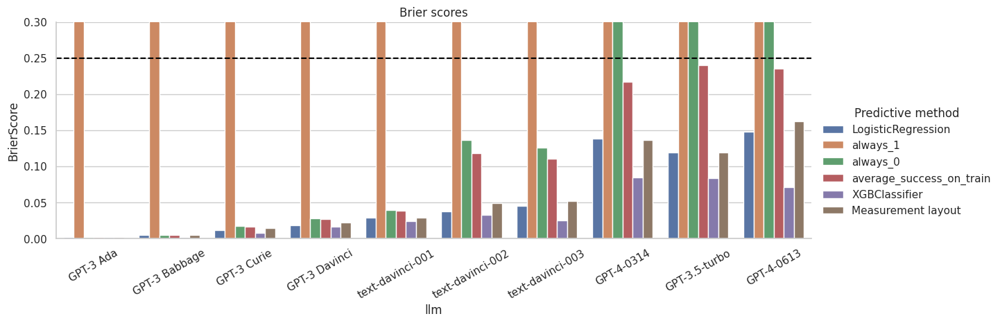

In [ ]:
g = sns.catplot(x="llm", y="BrierScore", hue="predictive_method", data=predictive_methods_mes_lay_combined_df, kind="bar", height=4, aspect=3, legend_out=True)
plt.ylim(0, .3)
plt.axhline(y=0.25, color='black', linestyle='--')
plt.title("Brier scores")
plt.xticks(rotation=30)
g._legend.set_title('Predictive method')
filename = "/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/brier_scores_assessors_mes_layout.png"
plt.savefig(filename, dpi=300, bbox_inches = 'tight')
plt.show()

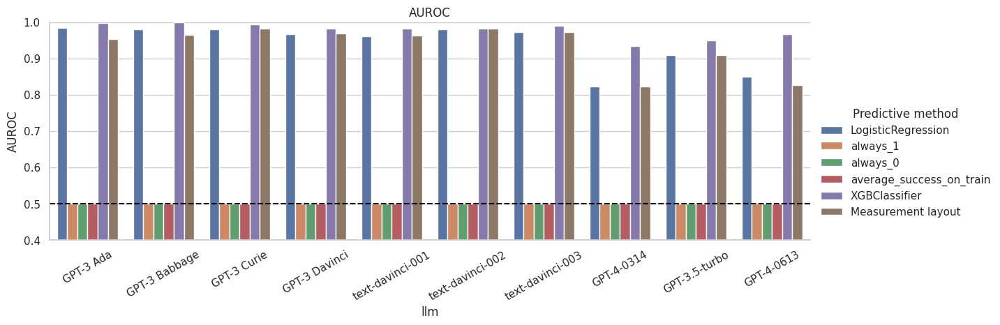

In [ ]:
g = sns.catplot(x="llm", y="AUROC", hue="predictive_method", data=predictive_methods_mes_lay_combined_df, kind="bar", height=4, aspect=3, legend_out=True)
plt.ylim(0.4, 1)
plt.axhline(y=0.50, color='black', linestyle='--')
plt.title("AUROC")
plt.xticks(rotation=30)
g._legend.set_title('Predictive method')
filename = "/content/drive/MyDrive/Colab Notebooks/EuADS Summer School tutorial on measurement layouts/plots/auroc_assessors_mes_layout.png"
plt.savefig(filename, dpi=300, bbox_inches = 'tight')
plt.show()